# 16-CH POLIMI-TCSPC Bursts Analysis

*This notebook uses [FRETBursts](http://tritemio.github.io/FRETBursts/) software
to analize single-molecule data from the 16-channel POLIMI TCSPC line-excitation setup.*

## Loading FRETBursts

In [1]:
from fretbursts import *

 - Optimized (cython) burst search loaded.
 - Optimized (cython) photon counting loaded.
--------------------------------------------------------------
 You are running FRETBursts (version 0.6+26.g2f59a03).

 If you use this software please cite the following paper:

   FRETBursts: An Open Source Toolkit for Analysis of Freely-Diffusing Single-Molecule FRET
   Ingargiola et al. (2016). http://dx.doi.org/10.1371/journal.pone.0160716 

--------------------------------------------------------------


In [2]:
%matplotlib inline

In [3]:
sns = init_notebook()

In [4]:
sns.set_style('ticks')

In [5]:
from pathlib import Path
import pandas as pd

In [6]:
import tcspc

In [7]:
def calc_offset_ns_mch(dx, idxmin, idxmax, rmin=0.1, rmax=0.9, cross_th=0.5, rebin=1, pdf=True, inbursts=False, subtract_min=True):
    offset_ns = np.zeros(16)
    for i in range(dx.nch):
        unit = dx.nanotimes_params[i]['tcspc_unit'] * 1e9
        ntimes = dx.nanotimes[i]
        if inbursts:
            ntimes = ntimes[dx.ph_in_bursts_mask_ich(i)]
        offset_ns[i] = tcspc.decay_hist_offset(ntimes, unit, idxmin=idxmin, idxmax=idxmax, rebin=rebin, pdf=pdf,
                                               rmin=rmin, rmax=rmax, cross_th=cross_th)
    if subtract_min:
        offset_ns -= offset_ns.min()
    return offset_ns

In [8]:
def linplot16(values, figsize=(6, 4), ax=None, title=None, kind='plot', **plt_kws):
    if ax is None:
        _, ax = plt.subplots(figsize=figsize)
    
    if kind == 'plot':
        plt_kws.setdefault('marker', 'o')
        plt_kws.setdefault('lw', 0)
        ax.plot(values, **plt_kws)
    elif kind == 'errorbar':
        ax.errorbar(x=np.arange(16), y=values, **plt_kws)
    else:
        left_bins = np.arange(16)
        ax.bar(left_bins, values, **plt_kws)
    ax.grid(True)
    ax.set_xticks(range(16))
    ax.set_xlabel('Spot')
    if title is not None:
        ax.set_title(title, va='bottom')
    return ax

In [9]:
savefigures = True

def savefig(fname, **kwargs):
    if not savefigures:
        return
    dir_ = 'figures/'
    kwargs.setdefault('dpi', 300)
    kwargs.setdefault('bbox_inches', 'tight')
    kwargs.setdefault('frameon', False)
    plt.savefig(dir_ + fname, **kwargs)

# Data Load

In [10]:
dir = r'E:\Data\Antonio\data\POLIMI-TCSPC-16ch\2015-09-04'
#dir = r'data/2015-09-04'

filename = dir + '/T-NTD-3new_66pM-100mW-LP-BP-Dich532-635_7.hdf5'

In [11]:
import os
if os.path.isfile(filename):
    print("Perfect, I found the file!")
else:
    print("Sorry, I can't find the file:\n%s" % filename)

Perfect, I found the file!


# IRF

In [12]:
from IPython.display import display

In [13]:
filename_irf = dir + '/irf-H2O-50um-100mW-BP-Dich532-635_2.hdf5'

In [14]:
filename_irf = dir + '/IRF-glass-air-100mW-BP-Dich532-635_9.hdf5'

In [15]:
filename_irf = dir + '/IRF-glass-air-100mW-BP-Dich532-635_10.hdf5'

In [16]:
d_irf = loader.photon_hdf5(filename_irf)
filename_irf

'E:\\Data\\Antonio\\data\\POLIMI-TCSPC-16ch\\2015-09-04/IRF-glass-air-100mW-BP-Dich532-635_10.hdf5'

In [17]:
print(d_irf.description.decode())

Test IRF

POLIMI-TCSPC module 16-CH [Pos1: 0403FE6A (ch 1-8), Pos3: 0403F16A (ch 9-16)]; Manta 0403DAE6.


In [18]:
d_irf.acquisition_duration

array(31.2)

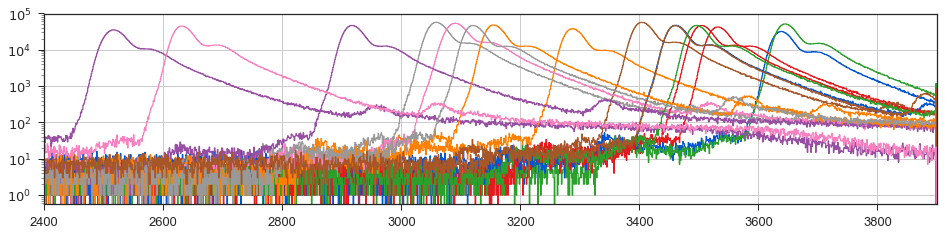

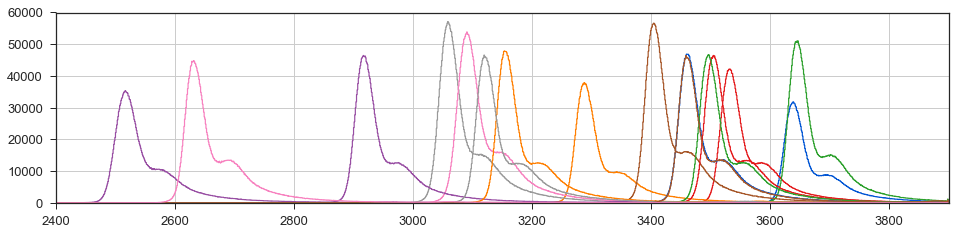

In [19]:
fig = plt.figure(figsize=(16, 3.5))
for nt in d_irf.nanotimes:
    plt.hist(nt, bins=np.arange(2400, 3900, 1), histtype='step', lw=1.2, normed=False);
plt.yscale('log')
plt.xlim(2400, 3900)
plt.grid()
display(fig)
plt.yscale('linear')

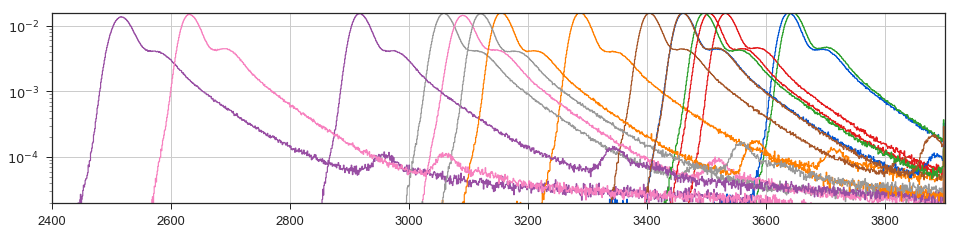

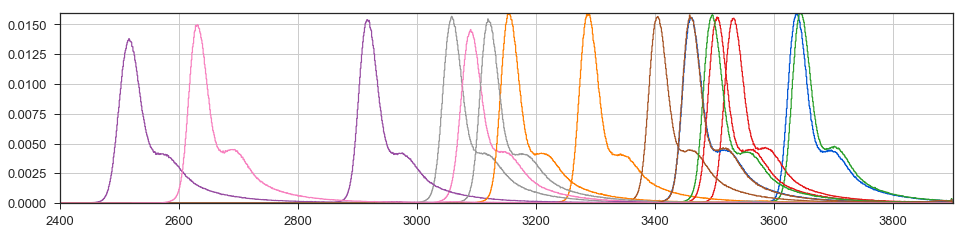

In [20]:
fig = plt.figure(figsize=(16, 3.5))
for nt in d_irf.nanotimes:
    plt.hist(nt, bins=np.arange(2400, 3900, 1), histtype='step', lw=1.2, normed=True);
plt.yscale('log')
plt.xlim(2400, 3900)
plt.grid()
plt.ylim(2e-5, 1.6e-2)
display(fig)
plt.yscale('linear')

In [21]:
offset_irf_ns0 = calc_offset_ns_mch(d_irf, idxmin=2400, idxmax=3900, rebin=1, subtract_min=False, cross_th=0.5)
offset_irf_ns0

array([ 12.06713398,  11.75628997,  12.38807198,   8.01550131,
        10.90246021,  10.09765573,  11.32477742,  10.14362612,
        11.54838128,  11.77114934,  11.45383551,   9.60577834,
        10.42382829,  10.03570465,  11.69219956,   8.65992102])

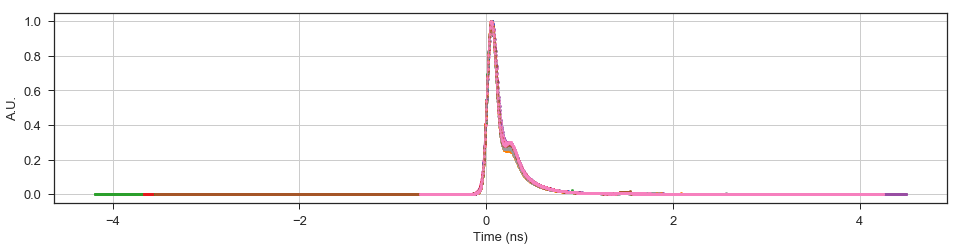

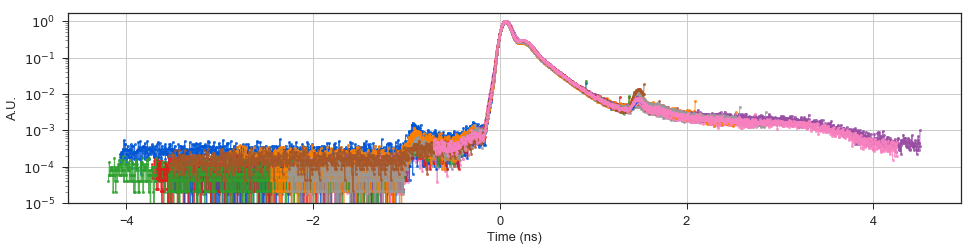

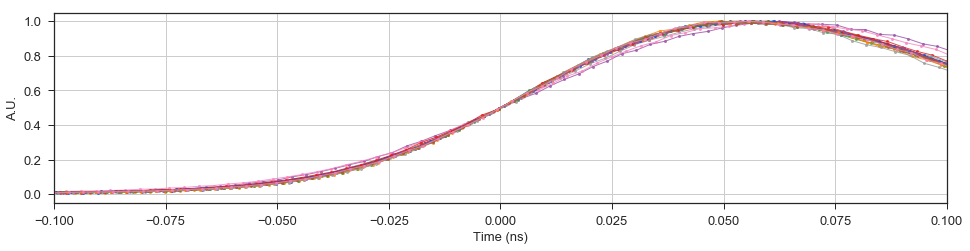

In [22]:
channels = range(16)
imin, imax = 2400, 3900

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    t, counts = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], unit, idxmin=imin, idxmax=imax, offset=offset_irf_ns0[i], pdf=True)
    plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('A.U.')
plt.grid(True)
display(fig)
plt.yscale('log')
display(fig)
plt.yscale('linear')
plt.xlim(-0.1, 0.1);

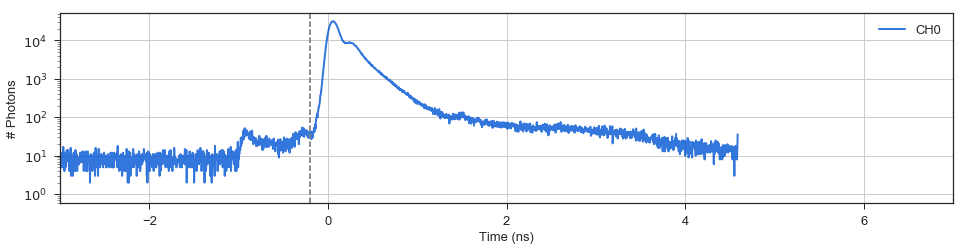

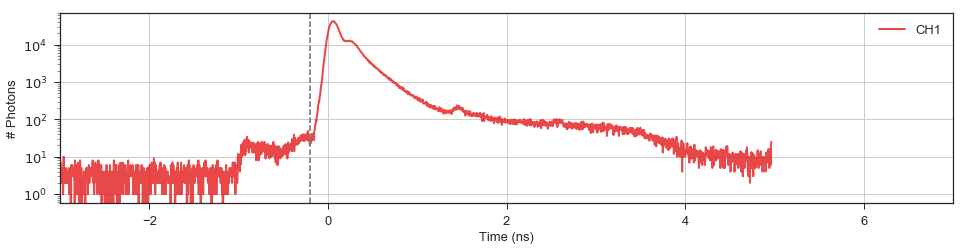

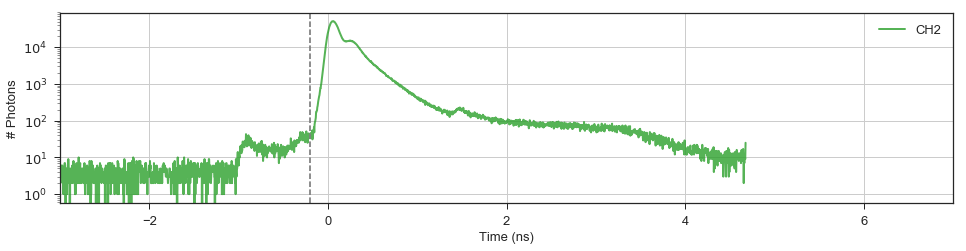

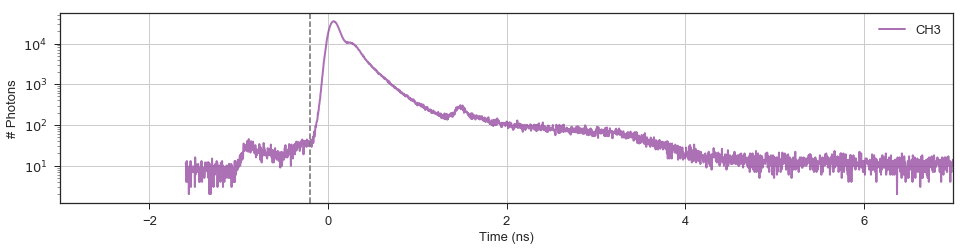

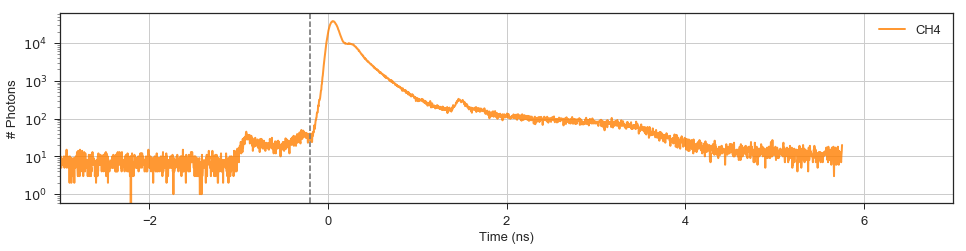

...

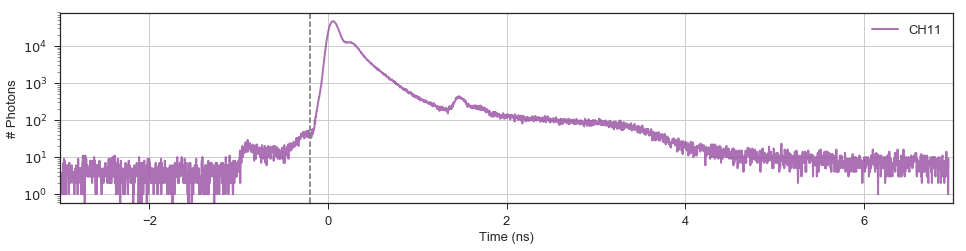

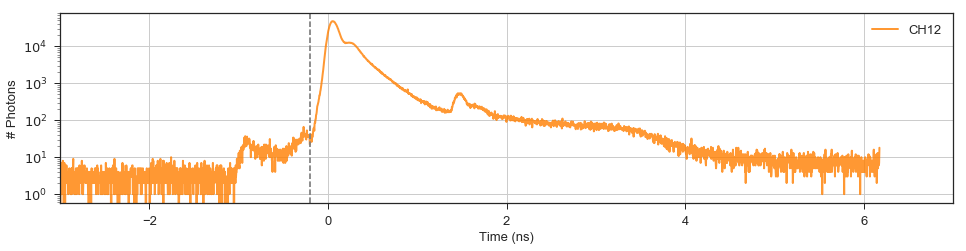

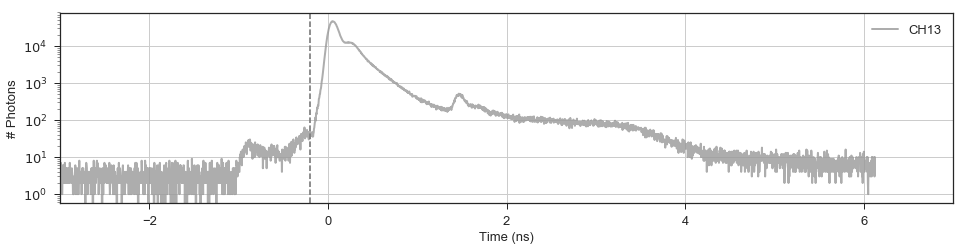

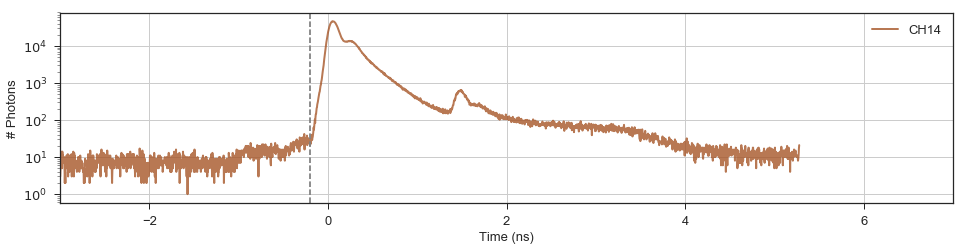

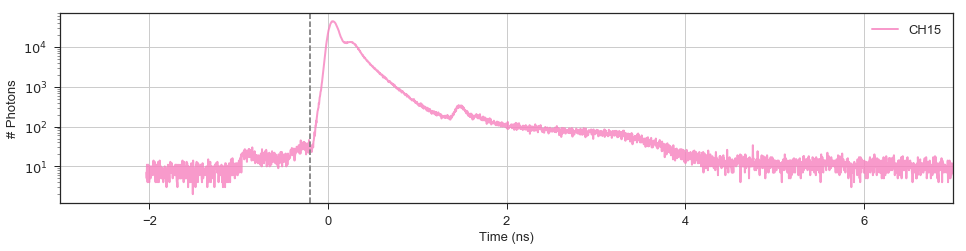

In [23]:
channels = range(16)
imin, imax = 2000, 5000

kws = dict(marker='o', ms=0, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    t, counts = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], unit, idxmin=imin, idxmax=imax, offset=offset_irf_ns0[i])
    plt.plot(t, counts, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.grid()
    plt.legend()
    plt.yscale('log')
    plt.xlabel('Time (ns)')
    plt.ylabel('# Photons')
    plt.xlim(-3, 7);
    plt.axvline(-0.2, ls='--', color='grey')

## Compute IRF FWHM

In [24]:
rebin = 2
irf_start, irf_stop = -0.5, 1.5
t1 = 1

irf_fwhm = np.zeros(16)
irf_fwhm_start = np.zeros(16)
irf_finalv = np.zeros(16)
for i in range(16):
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    irf_fwhm[i], irf_fwhm_start[i] = tcspc.fullwidth_alphamax(x_irf, irf_pdf, alpha=0.5)
    irf_unit = irf_pdf / irf_pdf.max()
    irf_finalv[i] = np.interp(t1, xp=x_irf, fp=irf_unit)

In [25]:
irf_fwhm_start

array([ -2.26885042e-04,  -1.50323767e-04,  -5.10436746e-04,
        -1.31893699e-04,  -2.78416616e-04,   9.59985735e-05,
        -2.76630385e-05,  -3.14541904e-04,  -9.10438451e-05,
        -6.06426776e-04,  -5.73884529e-05,   3.59822542e-06,
        -1.36999015e-04,  -3.63212771e-04,  -2.56383686e-04,
        -1.64413188e-04])

In [26]:
irf_fwhm_start

array([ -2.26885042e-04,  -1.50323767e-04,  -5.10436746e-04,
        -1.31893699e-04,  -2.78416616e-04,   9.59985735e-05,
        -2.76630385e-05,  -3.14541904e-04,  -9.10438451e-05,
        -6.06426776e-04,  -5.73884529e-05,   3.59822542e-06,
        -1.36999015e-04,  -3.63212771e-04,  -2.56383686e-04,
        -1.64413188e-04])

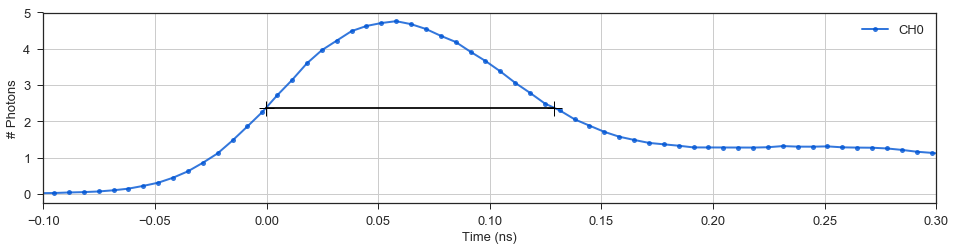

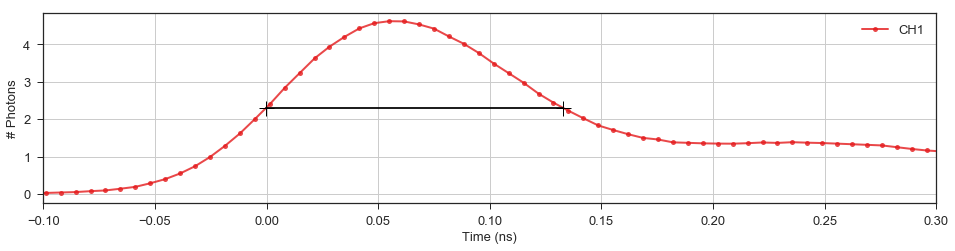

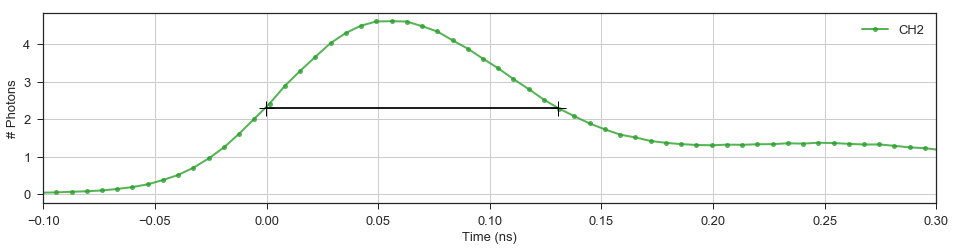

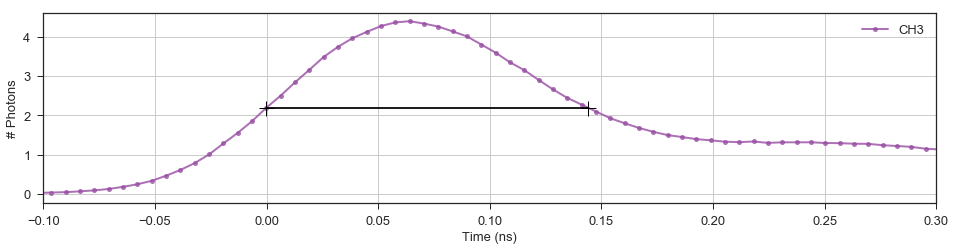

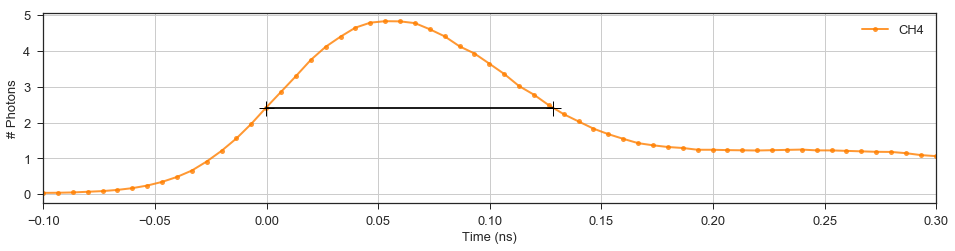

...

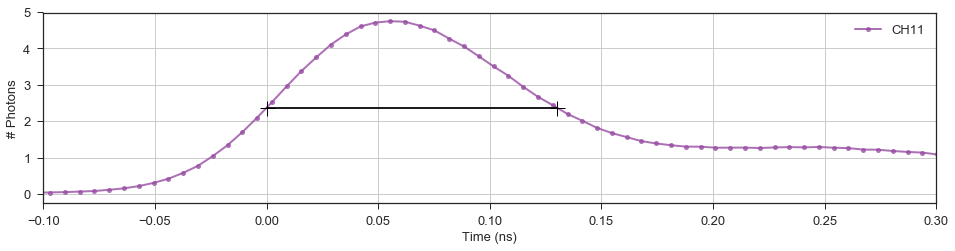

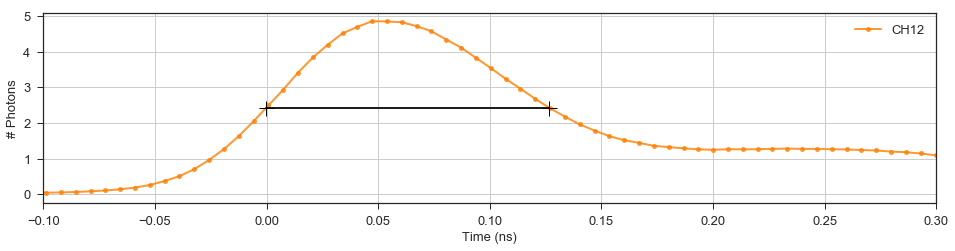

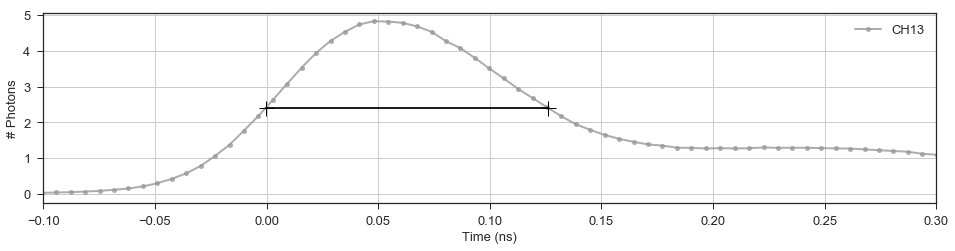

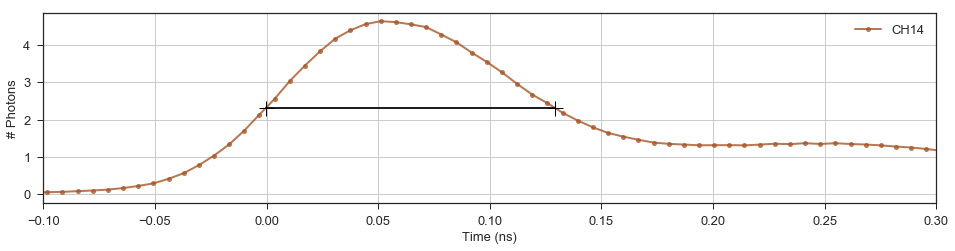

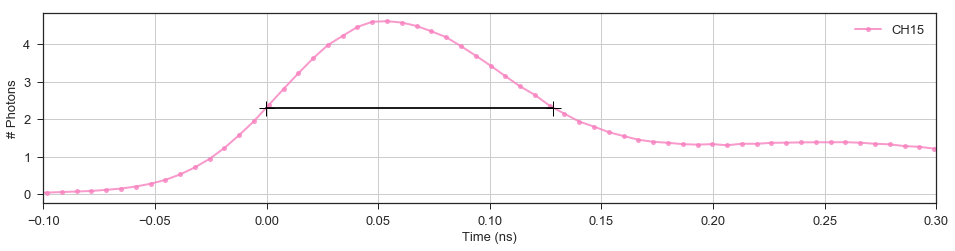

In [27]:
channels = range(16)
imin, imax = 2000, 5000

kws = dict(marker='o', ms=5, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    plt.plot(x_irf, irf_pdf, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.grid()
    plt.legend()
    plt.xlabel('Time (ns)')
    plt.ylabel('# Photons')
    plt.xlim(-0.1, 0.3);
    plt.plot([irf_fwhm_start[i], irf_fwhm_start[i] + irf_fwhm[i]], [irf_pdf.max() / 2]*2, '-+k', mew=1, ms=15)

In [28]:
irf_finalv*100

array([ 0.80708899,  0.86315834,  0.82042922,  0.93216228,  0.86905976,
        0.7800031 ,  0.86043284,  0.81361479,  0.86930435,  0.89590573,
        0.90365189,  0.9066362 ,  0.77648871,  0.84128925,  0.84446016,
        0.86977567])

In [29]:
np.round(irf_fwhm, 4)

array([ 0.1289,  0.1328,  0.1309,  0.1441,  0.1286,  0.1318,  0.1297,
        0.14  ,  0.1296,  0.1311,  0.1275,  0.1301,  0.1267,  0.1263,
        0.1293,  0.1286])

In [30]:
irf_fwhm.min(), irf_fwhm.max()

(0.1262795227487894, 0.14413415409447131)

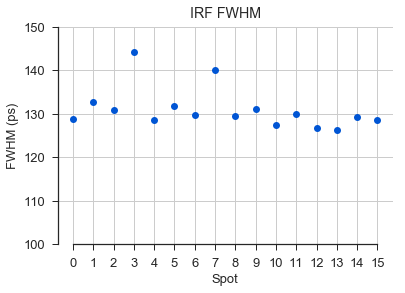

In [31]:
linplot16(irf_fwhm*1e3, title='IRF FWHM')
plt.ylabel('FWHM (ps)')
plt.ylim(100, 150)
sns.despine(trim=True)
savefig('irf_fwhm.png')

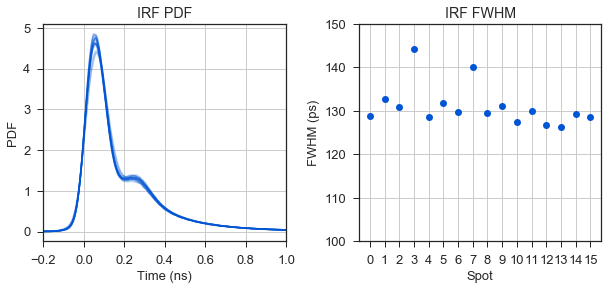

In [32]:
t1, t2 = 1, 18
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)

fig, ax = plt.subplots(1, 2, figsize=(10, 4), gridspec_kw={'width_ratios': [1, 1]})
plt.subplots_adjust(wspace=0.3)
axf = ax[1]
axi = ax[0]
for i in range(16):
    unit = d_irf.nanotimes_params[i]['tcspc_unit'] * 1e9
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    axi.plot(x_irf, irf_pdf, color='C0', alpha=0.3, lw=1.5)

linplot16(irf_fwhm*1e3, ax=axf)
plt.ylabel('FWHM (ps)')
axf.set_ylim(100, 150)    

axi.set_xlim(-0.2, 1)
axi.set_ylabel('PDF' if pdf else '# Photons')
axi.set_xlabel('Time (ns)')
axi.grid(True)
axi.set_title('IRF %s' % ('PDF' if pdf else 'Histogram'))
axf.set_title('IRF FWHM')
savefig('IRF_specs.png')

# Load the selected file

Here we load the file and we set the alternation parameters:

In [33]:
d = loader.photon_hdf5(filename)
filename

'E:\\Data\\Antonio\\data\\POLIMI-TCSPC-16ch\\2015-09-04/T-NTD-3new_66pM-100mW-LP-BP-Dich532-635_7.hdf5'

In [34]:
print(d.description.decode())

Good measurement of 60uL of sample without gasket. 20uL of buffer were added within 30s of measurement start  to reduce concentration from 100pM to 66pM.

POLIMI-TCSPC module 16-CH [Pos1: 0403FE6A (ch 1-8), Pos3: 0403F16A (ch 9-16)]; Manta 0403DAE6.


In [35]:
d.acquisition_duration, d.time_min, d.time_max

(array(927.7), 24.969267199999997, 952.62924129999999)

In [36]:
data16ch = pd.read_csv('data/DCR_2015-08-28.csv', index_col=0)
data16ch['Signal'] = ((d.ph_data_sizes / d.acquisition_duration) - data16ch.DCR).round(1)
data16ch

,DCR,Signal
CH,,
0,3019.8,10215.3
1,175.4,11078.4
2,546.0,11527.7
3,1903.9,11958.2
4,1864.4,12280.1
...,...,...
11,385.9,11536.8
12,124.7,11082.1
13,144.0,10668.7


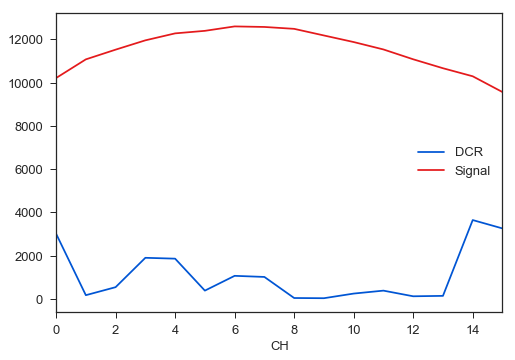

In [37]:
data16ch.plot()

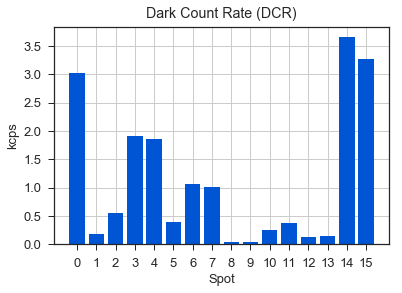

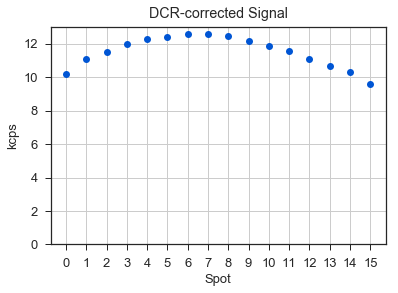

In [38]:
linplot16(data16ch.DCR*1e-3, kind='bar', title='Dark Count Rate (DCR)')
plt.ylabel('kcps')
savefig('DCR.png')
linplot16(data16ch.Signal*1e-3, title='DCR-corrected Signal')
plt.ylabel('kcps')
plt.ylim(0, 13)
savefig('signal.png')

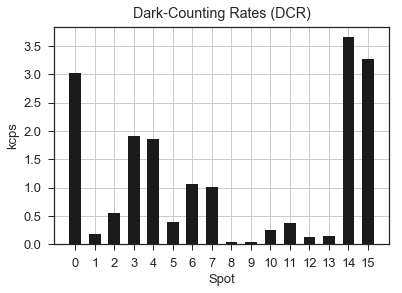

In [39]:
linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.6, title='Dark-Counting Rates (DCR)')
plt.ylabel('kcps')
savefig('DCR_black.png')

In [40]:
data16ch.columns

Index(['DCR', 'Signal'], dtype='object')

In [41]:
d.A_em[0]

slice(None, None, None)

In [42]:
#%matplotlib notebook

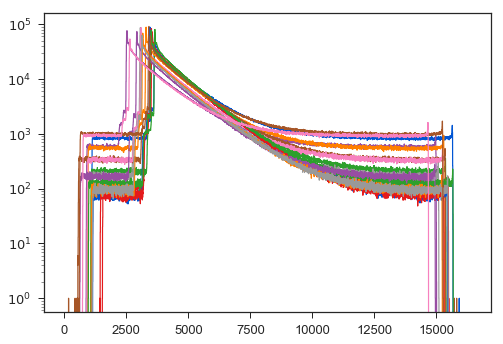

In [43]:
for nt in d.nanotimes:
    plt.hist(nt, bins=np.arange(0, 2**14, 4), histtype='step', lw=1.2);
plt.yscale('log')

# Background

(1, 100000000.0)

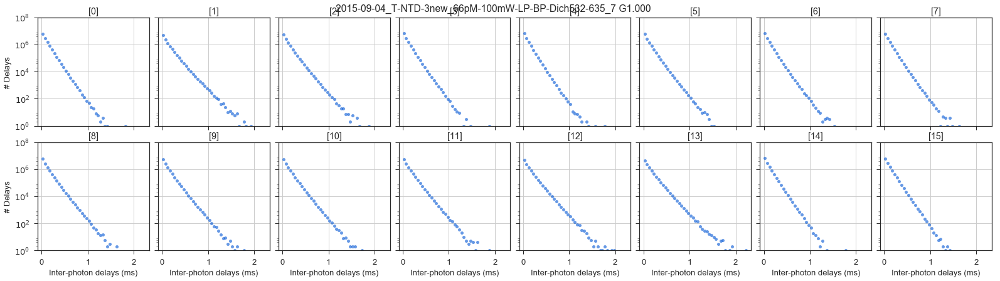

In [44]:
dplot(d, hist_interphoton_single, binwidth=50e-6)
plt.ylim(1, 1e8)

In [45]:
d.calc_bg_cache(fun=bg.exp_fit, time_s=60, tail_min_us=200)

 * Loading BG rates from cache ... 
 - Loading bakground data:  [DONE]


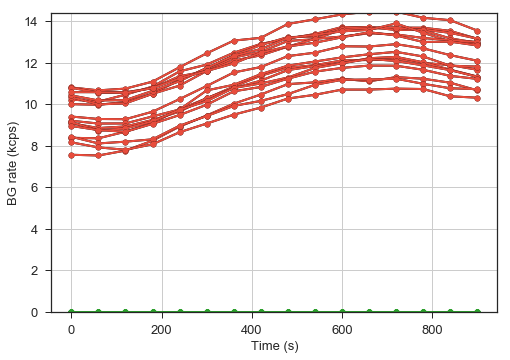

In [46]:
for ich in range(16):
    timetrace_bg(d, i=ich, nolegend=True)

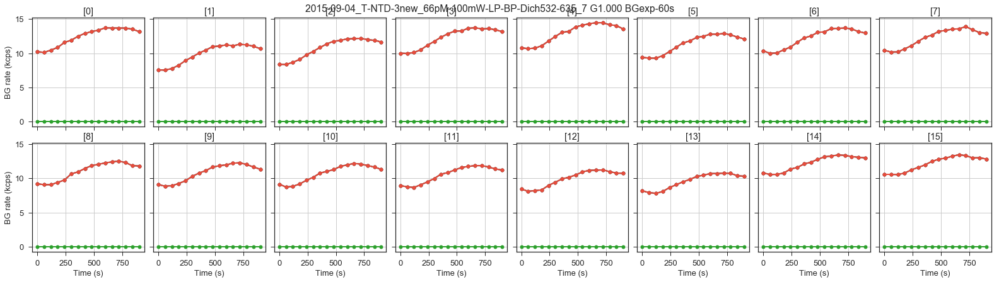

In [47]:
dplot(d, timetrace_bg);

In [48]:
data16ch['RAW Background'] = [b[:3].mean() for b in d.bg[Ph_sel('all')]]
#data16ch['RAW Background'] = d.bg_mean[Ph_sel('all')]

In [49]:
data16ch['Background'] = data16ch['RAW Background'] - data16ch['DCR']

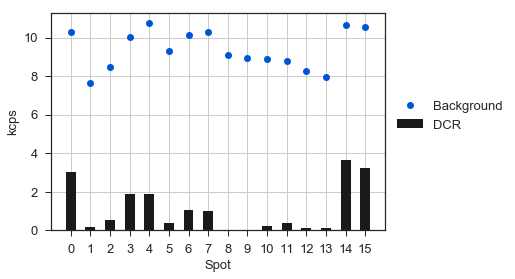

In [50]:
linplot16(data16ch['RAW Background']*1e-3, label='Background')
linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.5, ax=plt.gca(), label='DCR')
plt.legend(bbox_to_anchor=(1, 0.65), loc='upper left');
plt.ylabel('kcps')
#savefig('background_vs_dcr.png')

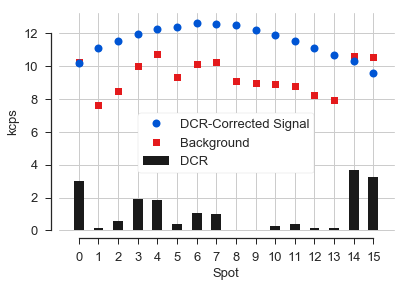

In [51]:
linplot16(data16ch.Signal*1e-3, zorder=10, ms=8, label='DCR-Corrected Signal')
#linplot16(data16ch.Background*1e-3, marker='s', label='DCR-Corrected Background', zorder=1, ax=plt.gca())
linplot16(data16ch['RAW Background']*1e-3, marker='s', label='Background', zorder=1, ax=plt.gca())

linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.5, label='DCR', ax=plt.gca())
plt.ylabel('kcps')
leg = plt.legend(bbox_to_anchor=(1, 0.5), loc='center left');
savefig('signal_vs_raw_background_vs_dcr.png')
leg = plt.legend(bbox_to_anchor=(0.5, 0.4), loc='center', frameon=True);
leg.get_frame().set(facecolor='w', alpha=1)
sns.despine(trim=True, offset=8)
savefig('signal_vs_raw_background_vs_dcr_legend_inside.png')

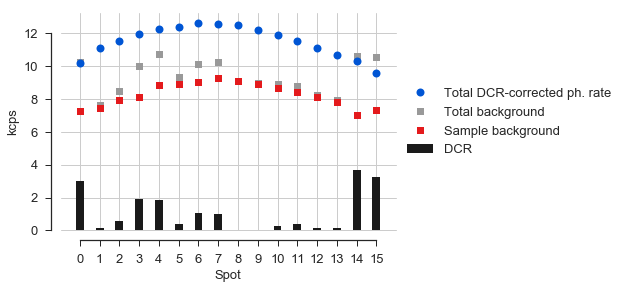

In [52]:
ax = linplot16(data16ch.Signal*1e-3, zorder=10, ms=8, label='Total DCR-corrected ph. rate')
linplot16(data16ch['RAW Background']*1e-3, marker='s', color='0.6', zorder=1, label='Total background', ax=ax)
linplot16(data16ch.Background*1e-3, marker='s', color='C1', label='Sample background', ax=ax)
linplot16(data16ch.DCR*1e-3, kind='bar', color='.1', width=0.4, label='DCR', ax=plt.gca())

plt.ylabel('kcps')
leg = plt.legend(bbox_to_anchor=(1, 0.5), loc='center left');
leg.get_frame().set(facecolor='w', alpha=1)
sns.despine(trim=True, offset=10)
#savefig('signal_vs_background_vs_dcr_legend_inside.png')
savefig('signal_vs_bg_vs_sbg_vs_dcr.png')

In [53]:
bg = 1e-3*data16ch.loc[:,('RAW Background', 'Background')]
bg.columns = ('Total_BG', 'BG_minus_DCR')
bg.index.name = 'Spot'
bg_ty = pd.melt(bg.reset_index(), id_vars='Spot', var_name='BG', value_name='Counts (kcps)')
bg_ty.head()

,Spot,BG,Counts (kcps)
0,0,Total_BG,10.271956
1,1,Total_BG,7.621350
2,2,Total_BG,8.473470
3,3,Total_BG,10.028671
4,4,Total_BG,10.742948


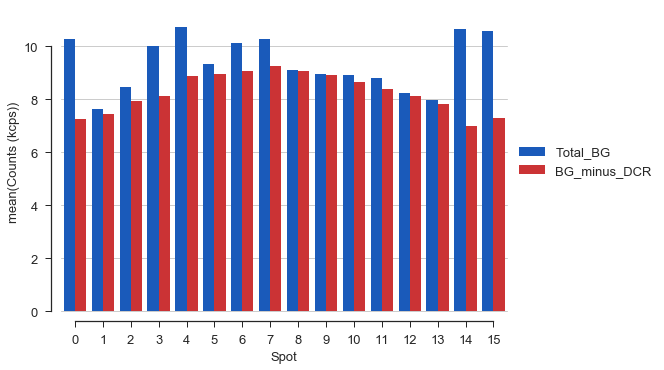

In [54]:
sns.barplot(x='Spot', y='Counts (kcps)', data=bg_ty, hue='BG')
plt.legend(bbox_to_anchor=(1, 0.5), loc='center left', title='')
sns.despine(offset=10, trim=True)
plt.grid(axis='y')

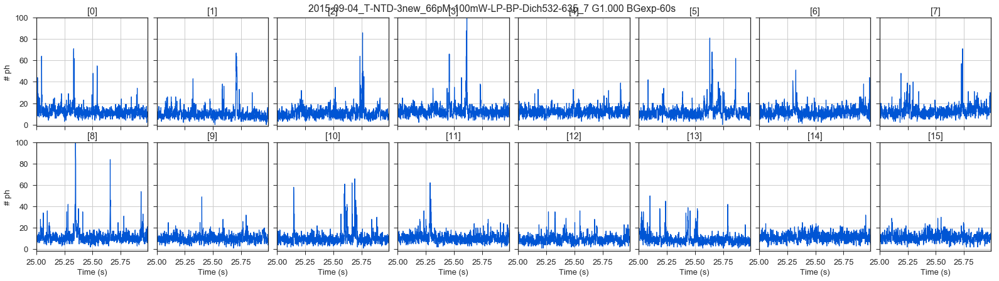

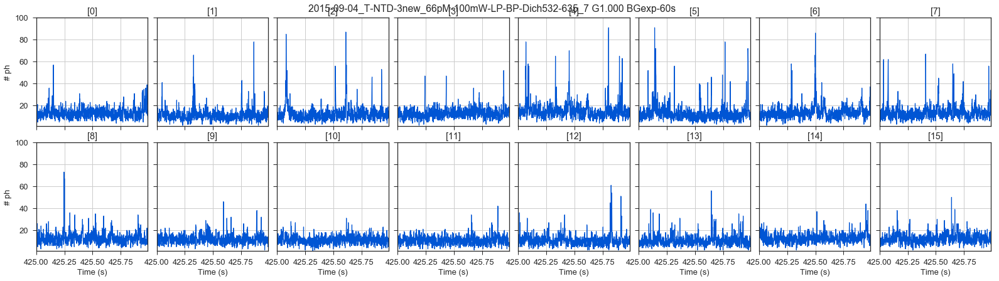

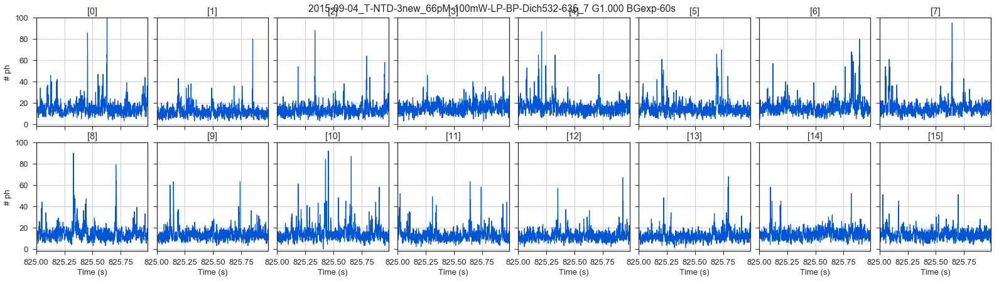

In [55]:
start = int(d.time_min) + 1
for i in (0, 400, 800):
    dplot(d, timetrace_single, tmin=start+i, tmax=start+i+1, show_rate_th=False);
    plt.xlim(start+i, start+i+0.99)

# Timetrace figure

In [56]:
sns.set_style('ticks')

In [57]:
start = int(d.time_min) + 1

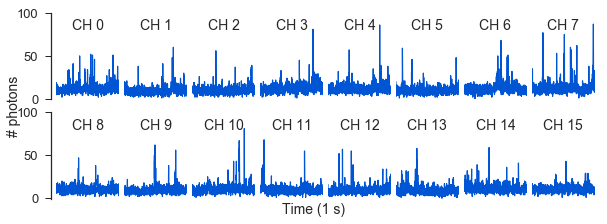

In [58]:
i = 2
ax = bpl.dplot_16ch(d, timetrace_single, tmin=start+i, tmax=start+i+1, show_rate_th=False, suptitle=False, figsize=(8.5, 3));
plt.xlim(start+i, start+i+1)
#plt.ylim(0, 99)
for a in ax[:, 1:].ravel():
    a.yaxis.set_visible(False)
for i, a in enumerate(ax.ravel()):
    a.set(title='', xlabel='', ylabel='')
    a.xaxis.set_visible(False)
    sns.despine(ax=a, left=True, bottom=True, offset=5)
    a.grid(False)
    a.text(0.5, 0.85, 'CH %d' % i, va='center', ha='center', transform=a.transAxes, fontsize=14)
for a in ax[:, 0]:
    sns.despine(ax=a, left=False, bottom=True, offset=5)
fig = a.figure
fig.text(0.5, 0.00, 'Time (1 s)', ha='center', fontsize=14)
fig.text(0.0, 0.5, '# photons', va='center', rotation='vertical', fontsize=14)
savefig('timetrace_16_small.png')

# Burst search: const. SBR

In [59]:
dF = d.copy()

Deep copy executed.


In [60]:
dF.burst_search(F=3.4)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   - Applying leakage correction.
   [DONE Counting D/A]


In [61]:
dFs = dF.select_bursts(select_bursts.size, th1=30)

# Burst search: constant rate

In [62]:
d.burst_search(min_rate_cps=70e3)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   - Applying leakage correction.
   [DONE Counting D/A]


In [63]:
d.calc_max_rate(m=10)

## Burst sizes

In [64]:
th1 = 20

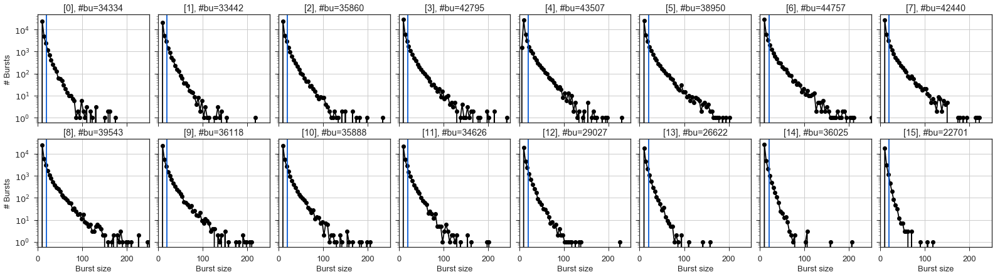

In [65]:
ax = dplot(d, hist_size, suptitle=False);
plt.xlim(0, 250)
savefig('burstsize.png')
for a in ax.ravel():
    a.axvline(th1)

In [66]:
ds = d.select_bursts(select_bursts.size, th1=th1)

mean_bs = np.array([nt.mean() - th1 for nt in ds.nt])

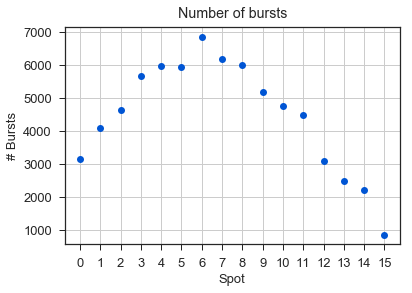

In [67]:
linplot16(ds.num_bursts, title='Number of bursts')
plt.ylabel('# Bursts');
savefig('numbursts_th%d.png' % th1)

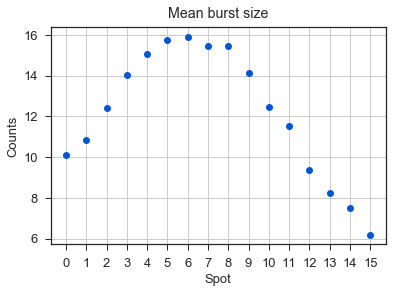

In [68]:
linplot16(mean_bs, title='Mean burst size')
plt.ylabel('Counts');
savefig('meaburstsize_th%d.png' % th1)

## Burst durations

In [69]:
bw_th = 0.3

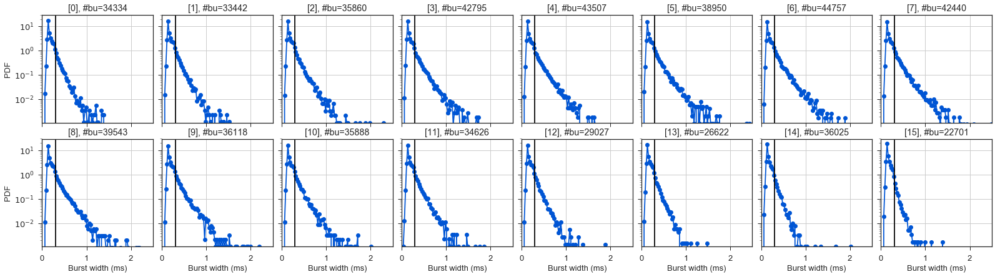

In [70]:
ax = dplot(d, hist_width, suptitle=False);
plt.xlim(0, 2.5)
savefig('burstwidth.png')
for a in ax.ravel():
    a.axvline(bw_th, color='k')

In [71]:
d.mburst[0].width

array([2636, 3797, 2767, ..., 2537, 4878, 3340], dtype=int64)

In [72]:
bw_th_clk = bw_th * 1e-3 / d.clk_p
mean_bw = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_th 
           for bursts in ds.mburst]
mean_bw = np.array(mean_bw)
mean_bw[:3]

array([ 0.12411984,  0.1248452 ,  0.14067488])

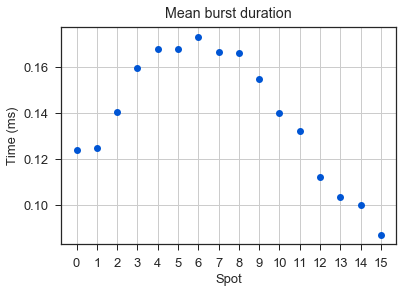

In [73]:
linplot16(mean_bw, title='Mean burst duration')
plt.ylabel('Time (ms)');
savefig('meaburstwidth_th%.1fms.png' % bw_th)

## Burst peak ph. rates

In [74]:
mr_th = 100e3

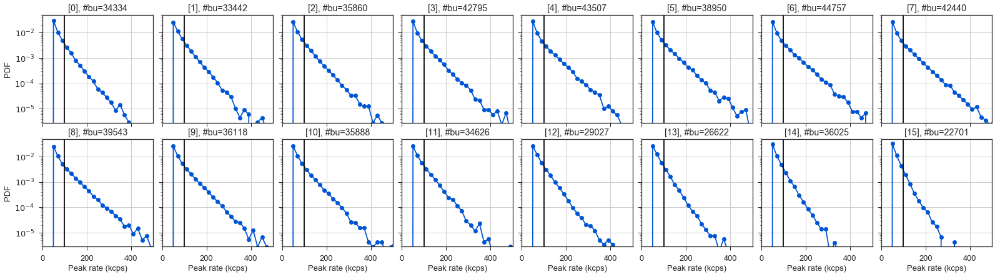

In [75]:
ax = dplot(d, hist_burst_phrate, suptitle=False);
plt.xlim(0, 500)
savefig('peak_ph_rate.png')
for a in ax.ravel():
    a.axvline(mr_th*1e-3, color='k')

In [76]:
d.max_rate[0]

array([ 50470.97508291,  72717.4786138 ,  47597.30627982, ...,
        49909.13626922,  94804.73538343,  44190.19240896])

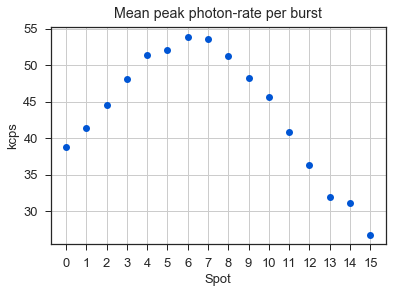

In [77]:
mmr = np.array([1e-3*(mr[mr > mr_th].mean() - mr_th) for mr in d.max_rate])

linplot16(mmr, title='Mean peak photon-rate per burst')
plt.ylabel('kcps');
savefig('mean_peak_ph_rate.png')

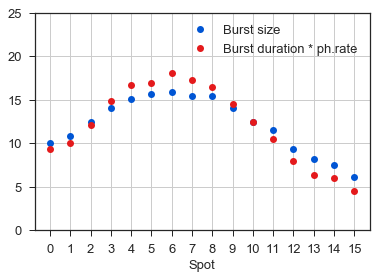

In [78]:
sim_mean_bs = (mean_bw * mmr) * mean_bs.mean() / (mean_bw * mmr).mean()
linplot16(mean_bs, label='Burst size')
linplot16(sim_mean_bs, label='Burst duration * ph.rate', ax=plt.gca())
plt.legend()
plt.ylim(0, 25);

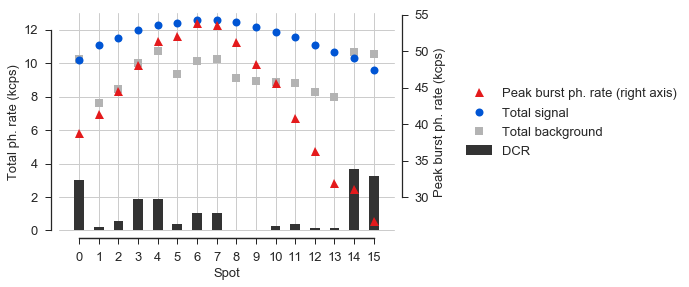

In [79]:
ax = linplot16(data16ch.Signal*1e-3, zorder=10, ms=8, label='Total signal')
linplot16(data16ch['RAW Background']*1e-3, marker='s', color='0.7', label='Total background', zorder=1, ms=8, ax=ax)
linplot16(data16ch.DCR*1e-3, kind='bar', color='.2', width=0.5, label='DCR', ax=ax)
plt.ylabel('Total ph. rate (kcps)')
ax.set_ylim(0, 13)
ax2 = plt.twinx()
linplot16(mmr, label='Peak burst ph. rate (right axis)', ax=ax2, color='C1', marker='^', ms=9)
ax2.grid(False)
ax2.set_ylabel('Peak burst ph. rate (kcps)')

leg2 = ax2.legend(bbox_to_anchor=(1.18, 0.63), loc='center left');
leg = ax.legend(bbox_to_anchor=(1.18, 0.45), loc='center left');
#savefig('signal_vs_raw_background_vs_dcr.png')
#leg = plt.legend(bbox_to_anchor=(0.5, 0.4), loc='center', frameon=True);
#leg.get_frame().set(facecolor='w', alpha=1)
sns.despine(ax=ax, trim=True, offset=8)
sns.despine(ax=ax2, left=True, right=False, trim=True, offset=8)
savefig('signal_vs_raw_background_vs_dcr_vs_peak_ph_rate.png')

> This show the comparison between the signal profile and the peak burst photon rate profile.

# Burst search: PSF FWHM threshold

In [80]:
dw = d.copy()

Deep copy executed.


In [81]:
mmr

array([ 38.76574367,  41.43845021,  44.56577031,  48.1233145 ,
        51.31671307,  52.12808678,  53.86027317,  53.56705572,
        51.17288023,  48.29186753,  45.68350812,  40.89492068,
        36.36803323,  31.98617233,  31.05606942,  26.80476986])

In [82]:
dw.burst_search(min_rate_cps=mmr*1.2e3)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   - Applying leakage correction.
   [DONE Counting D/A]


In [83]:
dw.calc_max_rate(m=10)

In [84]:
dw.rate_th

array([ 46518.89240583,  49726.14025251,  53478.92437   ,  57747.97739863,
        61580.0556896 ,  62553.70413355,  64632.32779964,  64280.46686174,
        61407.45627615,  57950.24104053,  54820.20974833,  49073.90481119,
        43641.63987609,  38383.40679629,  37267.28330188,  32165.72382624])

## Burst sizes

In [85]:
th1w = 30

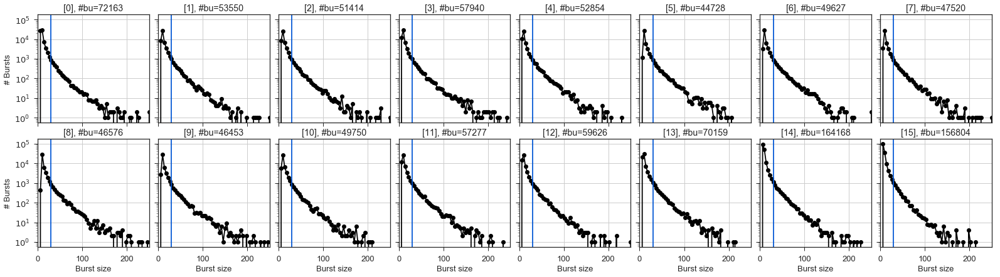

In [86]:
ax = dplot(dw, hist_size, suptitle=False);
plt.xlim(0, 250)
for a in ax.ravel():
    a.axvline(th1w)

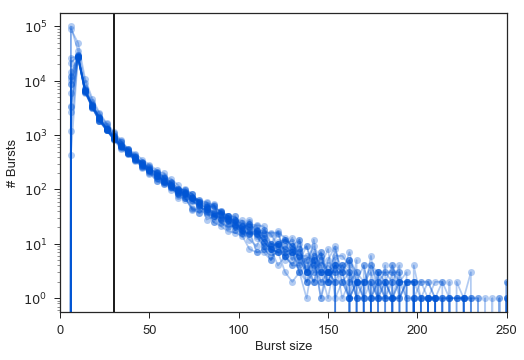

In [87]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_size(dw, i=ich, color='C0', plot_style=plt_kws, legend=False, pdf=False)
plt.xlim(0, 250)
plt.axvline(th1w, color='k')

In [88]:
dsw = dw.select_bursts(select_bursts.size, th1=th1w)

mean_bsw = np.array([nt.mean() - th1w for nt in dsw.nt])

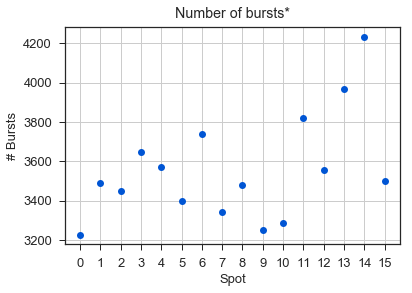

In [89]:
linplot16(dsw.num_bursts, title='Number of bursts*')
plt.ylabel('# Bursts');
savefig('numbursts_bs_peak_ph_rate_th%d.png' % th1w)

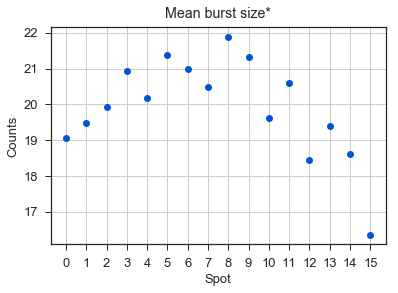

In [90]:
linplot16(mean_bsw, title='Mean burst size*')
plt.ylabel('Counts');
savefig('meaburstsize_bs_peak_ph_rate_th%d.png' % th1w)

In [91]:
sns.set_style('ticks')

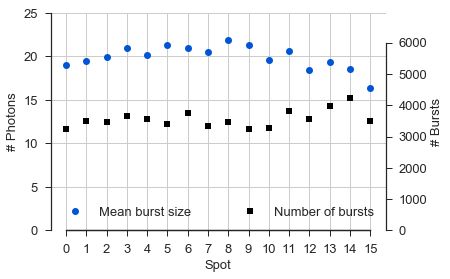

In [92]:
ax = linplot16(mean_bsw, label='Mean burst size')
ax.set(ylabel='# Photons', ylim=(0, 25))
ax2 = plt.twinx(ax)
linplot16(dsw.num_bursts, ax=ax2, marker='s', ms=6, color='k', label='Number of bursts')
ax2.grid(False)
ax2.set_ylabel('# Bursts');
ax2.set_ylim(0, 6950)
ax2.legend(loc='lower right')
ax.legend(loc='lower left')
sns.despine(ax=ax, right=True, left=False, trim=True)
sns.despine(ax=ax2, right=False, left=True, trim=True)
#savefig('meaburstsize_bs_peak_ph_rate_th%d_numbursts.png' % th1w)

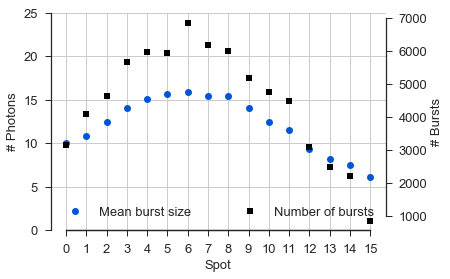

In [93]:
ax = linplot16(mean_bs, label='Mean burst size')
ax.set(ylabel='# Photons', ylim=(0, 25))
ax2 = plt.twinx(ax)
linplot16(ds.num_bursts, ax=ax2, marker='s', ms=6, color='k', label='Number of bursts')
ax2.grid(False)
ax2.set_ylabel('# Bursts');
#ax2.set_ylim(0, 6950)
ax2.legend(loc='lower right')
ax.legend(loc='lower left')
sns.despine(ax=ax, right=True, left=False, trim=True)
sns.despine(ax=ax2, right=False, left=True, trim=True)
#savefig('meaburstsize_bs_peak_ph_rate_th%d_numbursts.png' % th1w)

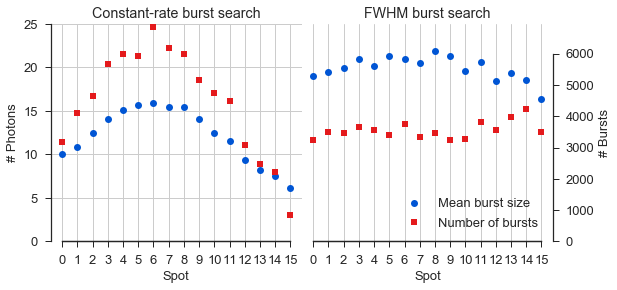

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(9, 4), sharey=True)
linplot16(mean_bs, label='Mean burst size', ax=ax[0], color='C0')
ax[0].set(ylabel='# Photons', ylim=(0, 25))
ax02 = plt.twinx(ax[0])
linplot16(ds.num_bursts, ax=ax02, marker='s', ms=6, color='C1', label='Number of bursts')
ax02.grid(False)
ax02.set(ylabel='# Bursts', ylim=(0, 6950))
#ax02.legend(loc='lower right')
#ax[0].legend(loc='lower left')
sns.despine(ax=ax[0], right=True, left=False, trim=True)
sns.despine(ax=ax02, right=False, left=True, trim=True)

linplot16(mean_bsw, label='Mean burst size', ax=ax[1], color='C0')
ax[1].set(ylabel='# Photons', ylim=(0, 25))
ax12 = plt.twinx(ax[1])
linplot16(dsw.num_bursts, ax=ax12, marker='s', ms=6, color='C1', label='Number of bursts')
ax12.grid(False)
ax12.set(ylabel='# Bursts', ylim=(0, 6950))
ax12.legend(loc='lower left', bbox_to_anchor=(0.35, 0))
ax[1].legend(loc='lower left', bbox_to_anchor=(0.35, 0.09))
sns.despine(ax=ax[1], right=True, left=False, trim=True)
sns.despine(ax=ax12, right=False, left=True, trim=True)

ax02.yaxis.set_visible(False)
ax02.spines['right'].set_visible(False)
ax[1].yaxis.set_visible(False)
ax[1].spines['left'].set_visible(False)
plt.subplots_adjust(wspace=0.0)
ax[0].set_title('Constant-rate burst search')
ax[1].set_title('FWHM burst search')
savefig('meaburstsize_numbursts_bs_comp.png')

In [95]:
# sns.set_style('darkgrid')

## Burst durations

In [96]:
bw_thw = 0.5

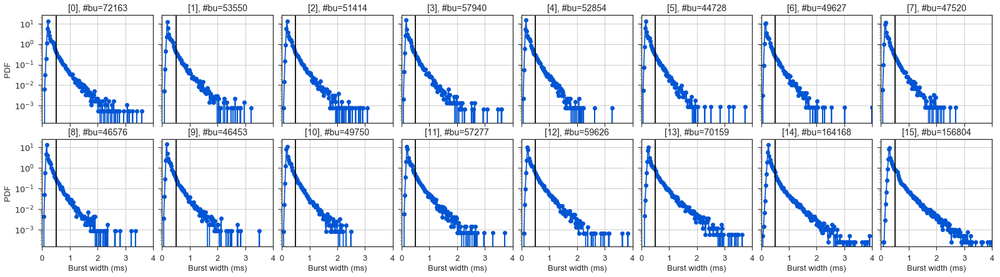

In [97]:
ax = dplot(dw, hist_width, suptitle=False);
plt.xlim(0, 4)
for a in ax.ravel():
    a.axvline(bw_thw, color='k')

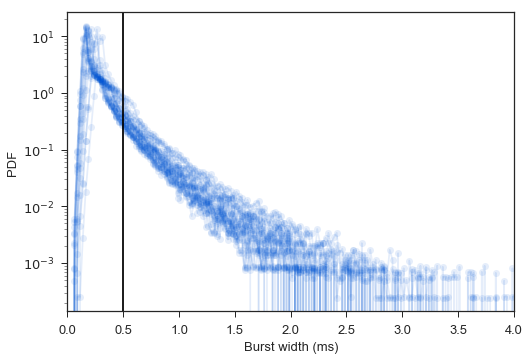

In [98]:
plt_kws = dict(alpha=0.1)
for ich in range(16):
    hist_width(dw, i=ich, color='C0', plot_style=plt_kws)
plt.xlim(0, 4)
plt.axvline(bw_thw, color='k')

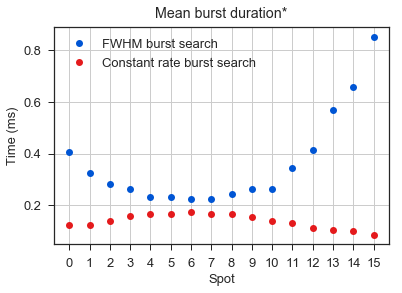

In [99]:
bw_thw = 0.5
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration*')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend()
#savefig('meaburstwidth_bs_peak_ph_rate_th%.1fms.png' % bw_thw)

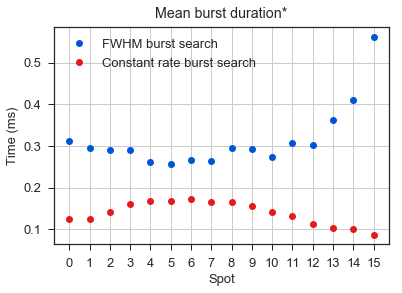

In [100]:
bw_thw = 0.8
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration*')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend()
#savefig('meaburstwidth_bs_peak_ph_rate_th%.1fms.png' % bw_thw)

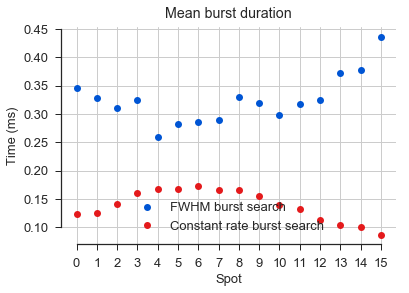

In [101]:
bw_thw = 1
bw_th_clk = bw_thw * 1e-3 / d.clk_p
mean_bww = [bursts.width[bursts.width > bw_th_clk].mean() * d.clk_p * 1e3 - bw_thw 
            for bursts in dsw.mburst]
mean_bww = np.array(mean_bww)

linplot16(mean_bww, label='FWHM burst search', title='Mean burst duration')
linplot16(mean_bw, label='Constant rate burst search', ax=plt.gca())
plt.ylabel('Time (ms)');
plt.legend(loc='lower center')
sns.despine(trim=True)
savefig('meaburstwidth_bs_comp.png')

## Burst peak ph. rates

In [102]:
mr_thw = 100e3

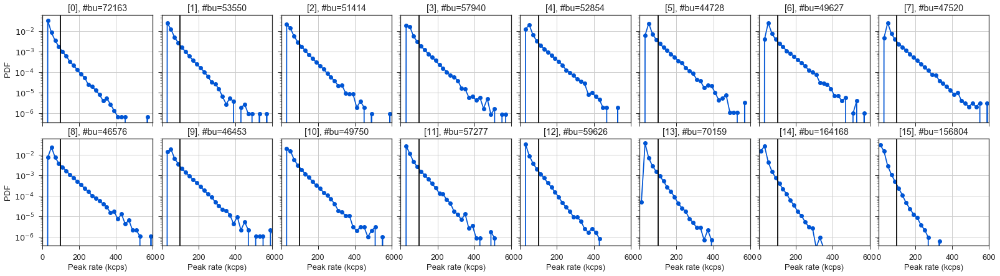

In [103]:
ax = dplot(dw, hist_burst_phrate, suptitle=False);
plt.xlim(0, 600)
#savefig('peak_ph_rate.png')
for a in ax.ravel():
    a.axvline(mr_thw*1e-3, color='k')

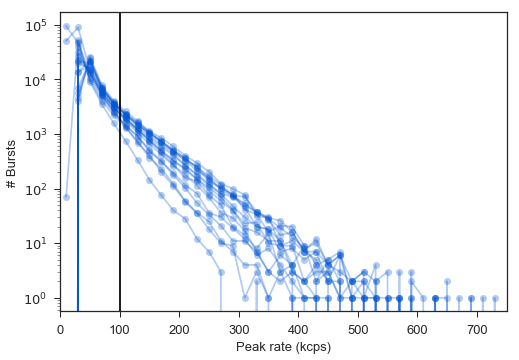

In [104]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_burst_phrate(dw, i=ich, color='C0', plot_style=plt_kws, pdf=False)
plt.xlim(0, 750)
plt.axvline(mr_thw*1e-3, color='k')

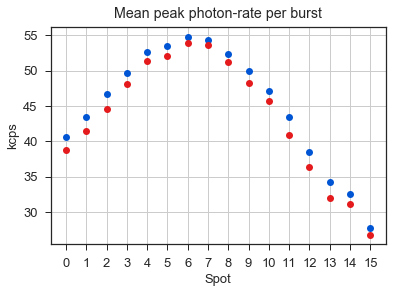

In [105]:
mmrw = np.array([1e-3*(mr[mr > mr_thw].mean() - mr_thw) for mr in dw.max_rate])

linplot16(mmrw, title='Mean peak photon-rate per burst')
linplot16(mmr, label='constant rate', ax=plt.gca())
plt.ylabel('kcps');

#savefig('mean_peak_ph_rate.png')

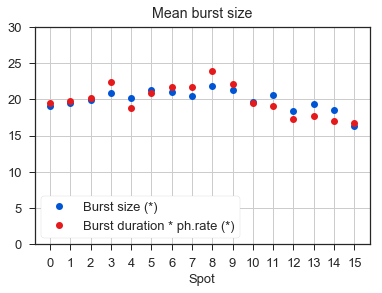

In [106]:
sim_mean_bsw = (mean_bww * mmrw) * mean_bsw.mean() / (mean_bww * mmrw).mean()
linplot16(mean_bsw, label='Burst size (*)', title='Mean burst size')
linplot16(sim_mean_bsw, label='Burst duration * ph.rate (*)', ax=plt.gca())
leg = plt.legend(loc='lower left', frameon=True)
leg.get_frame().set(facecolor='w', alpha=1)
plt.ylim(0, 30);

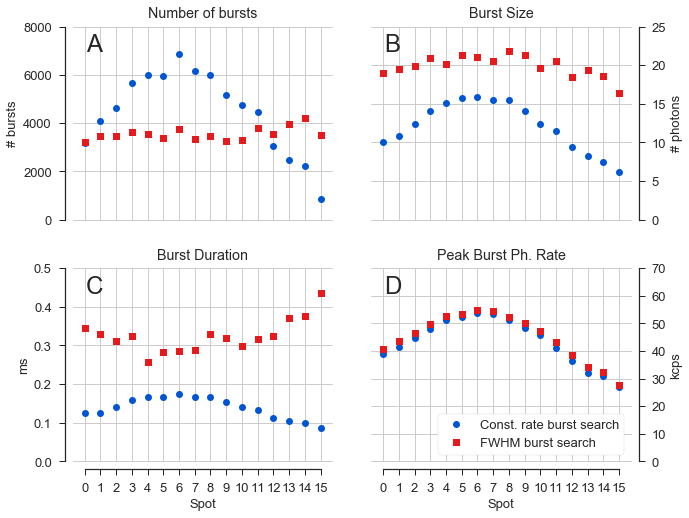

In [107]:
fig, ax = plt.subplots(2, 2, figsize=(10, 8), sharex=False)

linplot16(ds.num_bursts, title='Number of bursts', label='Const. rate burst search', ax=ax[0,0])
linplot16(dsw.num_bursts, label='FWHM burst search', marker='s', ax=ax[0,0])
ax[0,0].set(ylim=(0, 8000), ylabel='# bursts')

linplot16(mean_bs, title='Burst Size', label='Const. rate burst search', ax=ax[0,1])
linplot16(mean_bsw, label='FWHM burst search', marker='s', ax=ax[0,1])
ax[0,1].set(ylim=(0, 25), ylabel='# photons')

linplot16(mean_bw, title='Burst Duration', label='Const. rate burst search', ax=ax[1,0])
linplot16(mean_bww, label='FWHM burst search', marker='s', ax=ax[1,0])
ax[1,0].set(ylim=(0, 0.5), ylabel='ms')

linplot16(mmr, title='Peak Burst Ph. Rate', label='Const. rate burst search', ax=ax[1,1])
linplot16(mmrw, label='FWHM burst search', marker='s', ax=ax[1,1])
ax[1,1].set(ylim=(0, 70), ylabel='kcps')

sns.despine(ax=ax[0, 0], left=False, right=True, bottom=True, trim=True, offset=8)
sns.despine(ax=ax[0, 1], left=True, right=False, bottom=True, trim=True, offset=8)
sns.despine(ax=ax[1, 0], left=False, right=True, bottom=False, trim=True, offset=8)
sns.despine(ax=ax[1, 1], left=True, right=False, bottom=False, trim=True, offset=8)

for p, a in zip('ABCD', ax.ravel()):
    a.grid(True)
    a.text(0.05, 0.87, p, fontsize=24, transform=a.transAxes)

for a in ax[0]:
    a.set(xlabel='')
    a.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off') # labels along the bottom edge are off
for a in ax[:, 1]:
    a.yaxis.set_label_position("right")
    a.yaxis.set_ticks_position('right')
leg = ax[1,1].legend(loc='lower right', frameon=True)
leg.get_frame().set(facecolor='w', alpha=1)
plt.subplots_adjust(hspace=0.25, wspace=0.15)
savefig('burst_stats.png')

## Other 16-ch figures

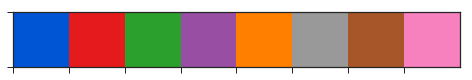

In [108]:
sns.palplot(sns.color_palette())

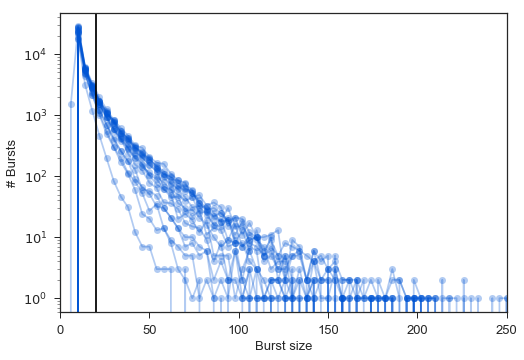

In [109]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_size(d, i=ich, color='C0', plot_style=plt_kws, legend=False, pdf=False)
plt.xlim(0, 250)
plt.axvline(20, color='k')

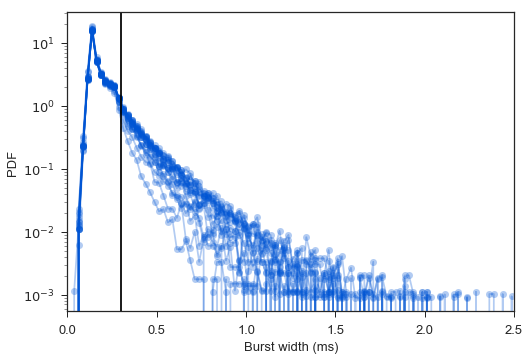

In [110]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_width(d, i=ich, color='C0', plot_style=plt_kws)
plt.xlim(0, 2.5)
plt.axvline(0.3, color='k')

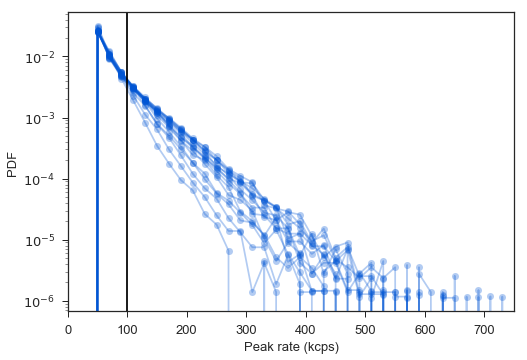

In [111]:
plt_kws = dict(alpha=0.3)
for ich in range(16):
    hist_burst_phrate(d, i=ich, color='C0', plot_style=plt_kws)
plt.xlim(0, 750)
plt.axvline(100, color='k')

# TCSPC Nanotimes

The nanotimes for the measurement is saved in the `.nanotimes` 
attribute of the `Data()` object (here either `d` or `ds`).

As an example here we get the array of nanotimes for all photons, 
donor emission and acceptor emission:

In [112]:
d.nanotimes

[array([4546, 6437, 3650, ..., 5169, 6334, 6057], dtype=uint16),
 array([5743, 4254, 5239, ..., 4804, 6128, 5582], dtype=uint16),
 array([ 9500,  5145,  5607, ...,  6443, 12126, 14320], dtype=uint16),
 array([ 2409,  2750, 11557, ...,  3257,  3300,  3107], dtype=uint16),
 array([ 4122,  3823, 14904, ...,  3362,  5510,  5984], dtype=uint16),
 array([6546, 6713, 6269, ..., 3405, 4279, 3956], dtype=uint16),
 array([4497, 3418, 6195, ..., 2192, 3412, 3926], dtype=uint16),
 array([2254, 3893, 5605, ..., 3118, 3208, 3411], dtype=uint16),
 array([3869, 3953, 4171, ..., 4109, 4127, 3590], dtype=uint16),
 array([5520, 4852, 5042, ..., 5256, 3616, 4306], dtype=uint16),
 array([5410, 4739, 3557, ..., 3495, 5262, 3557], dtype=uint16),
 array([4853, 3302, 4256, ..., 3835, 1337, 2934], dtype=uint16),
 array([4966, 5080, 3452, ..., 4349, 4351, 3135], dtype=uint16),
 array([3824, 5251, 7573, ..., 4128, 3152, 3138], dtype=uint16),
 array([4188, 4165, 9583, ..., 3830, 8926, 3834], dtype=uint16),
 array(

In [113]:
ph_in_bursts_mask = ds.ph_in_bursts_mask_ich()

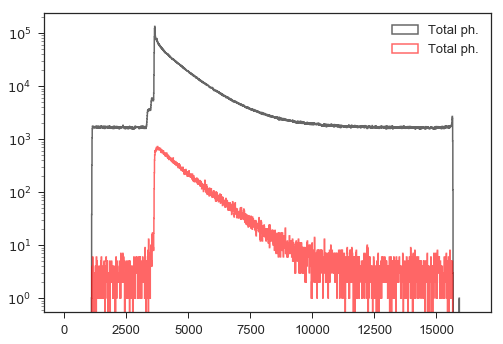

In [114]:
hist_params = dict(bins=range(0, 2**14, 8), histtype='step', alpha=0.6, lw=1.5)
hist(d.nanotimes[0], color='k', label='Total ph.', **hist_params)
hist(d.nanotimes[0][ph_in_bursts_mask], color='r', label='Total ph.', **hist_params)
plt.legend()
plt.yscale('log')

In [115]:
tcspc_unit = [p['tcspc_unit'] for p in ds.nanotimes_params]
len(tcspc_unit), tcspc_unit[:3]

(16, [3.332e-12, 3.345e-12, 3.414e-12])

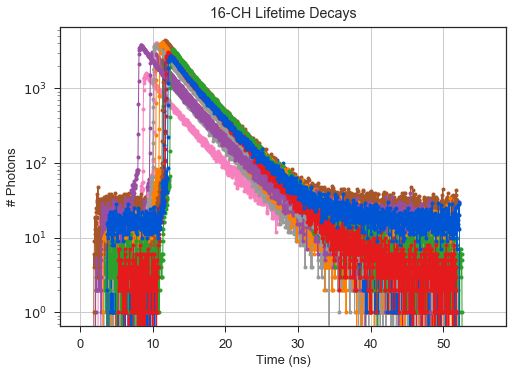

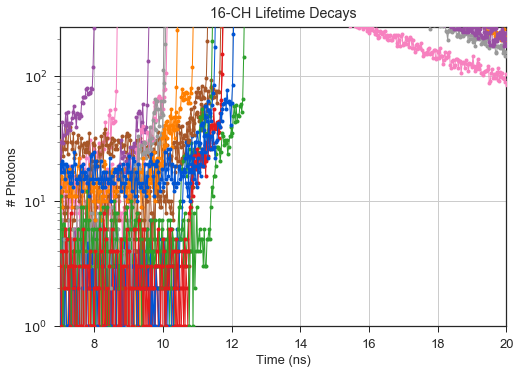

In [116]:
bins_r=np.arange(0, 2**14, 8)
kws = dict(marker='o', ms=4, lw=1, alpha=1)
for i in range(16):
    unit = tcspc_unit[i] * 1e9
    ph_in_bursts_mask = d.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask] * unit
    counts, bins = np.histogram(ntimes, bins=bins_r*unit)
    plt.plot(bins[1:], counts, zorder=20-i, **kws)
plt.grid(True)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
display(plt.gcf())
plt.xlim(7, 20)
plt.ylim(0, 250);

In [117]:
# i = 13
# unit = tcspc_unit[i] * 1e9
# ph_in_bursts_mask = d.ph_in_bursts_mask_ich(i)
# ntimes = d.nanotimes[i][ph_in_bursts_mask]
# t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8)

# %matplotlib inline

# plt.plot(t, counts)
# plt.xlim(9, 12)

In [118]:
kws = dict(idxmin=0, idxmax=2**14, rmin=0.1, rmax=0.8, cross_th=0.5, rebin=8, pdf=False)
offset_ns0 = calc_offset_ns_mch(d, inbursts=True, subtract_min=False, **kws)
offset_ns0

array([ 12.09516   ,  11.78601764,  12.40537051,   8.04423768,
        10.92423085,  10.12343876,  11.34710342,  10.1703682 ,
        11.56381879,  11.78964567,  11.47911397,   9.63156676,
        10.45147759,  10.06688872,  11.72113639,   8.69388143])

In [119]:
kws = dict(idxmin=0, idxmax=2**14, rmin=0.1, rmax=0.8, cross_th=0.5, rebin=8, pdf=False)
offset_ns_dsw = calc_offset_ns_mch(dsw, inbursts=True, subtract_min=False, **kws)
offset_ns_dsw

array([ 12.10306282,  11.7915512 ,  12.41547762,   8.05993803,
        10.94014564,  10.13499218,  11.36344349,  10.18474281,
        11.57842209,  11.80358212,  11.48678326,   9.64434508,
        10.45999388,  10.06741615,  11.72858017,   8.69750746])

In [120]:
offset_ns0.min()

8.0442376825028958

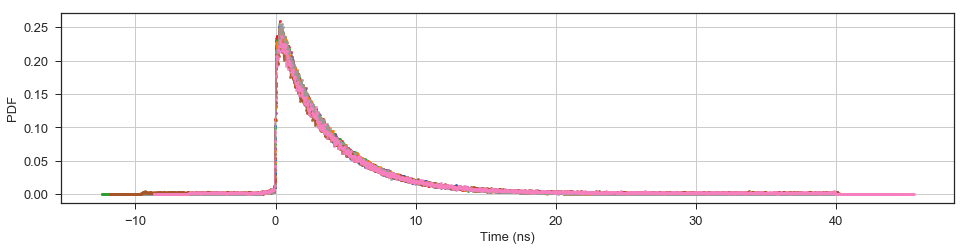

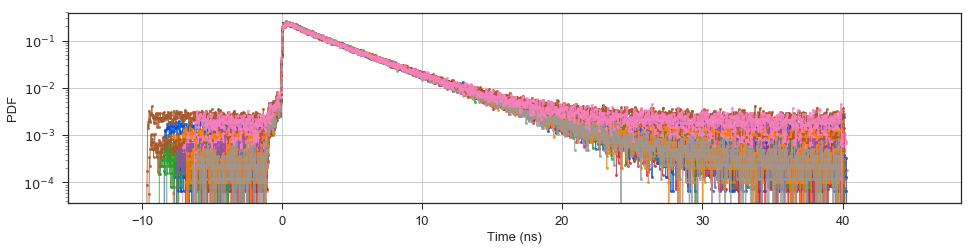

In [121]:
channels = range(16)
pdf = True
fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    t, counts = tcspc.calc_nanotime_hist_ich_ns(d, ich=i, inbursts=True, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts, label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.grid(True)
display(fig)
plt.yscale('log')

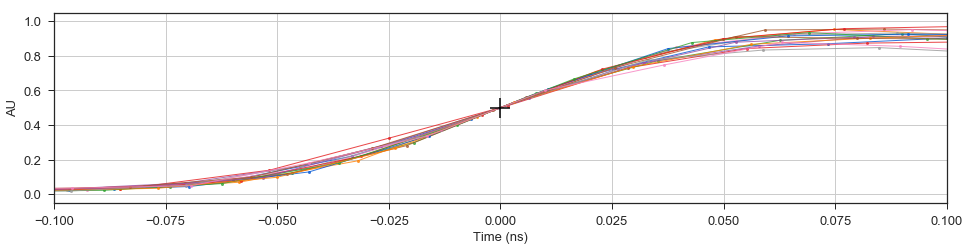

In [122]:
channels = range(16)
pdf = True
fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=0.8)
for i in channels:
    t, counts = tcspc.calc_nanotime_hist_ich_ns(d, ich=i, inbursts=True, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts/counts.max(), label='CH%d' % i, color='C%d' % (i % 8), **kws)
plt.xlabel('Time (ns)')
plt.ylabel('AU')
plt.grid(True)
plt.xlim(-0.1, 0.1);
plt.plot(0, 0.5, '+', mew=1.5, ms=20, color='k')

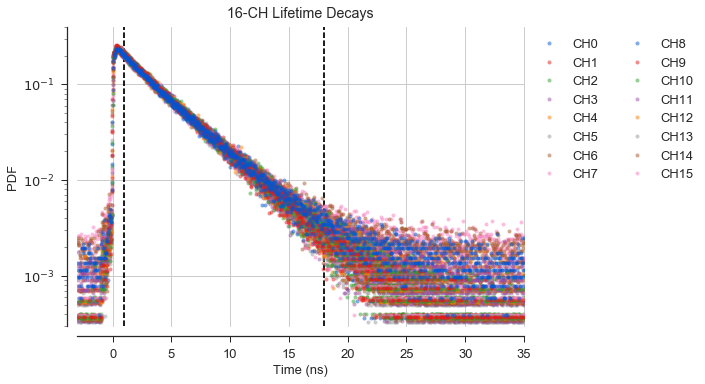

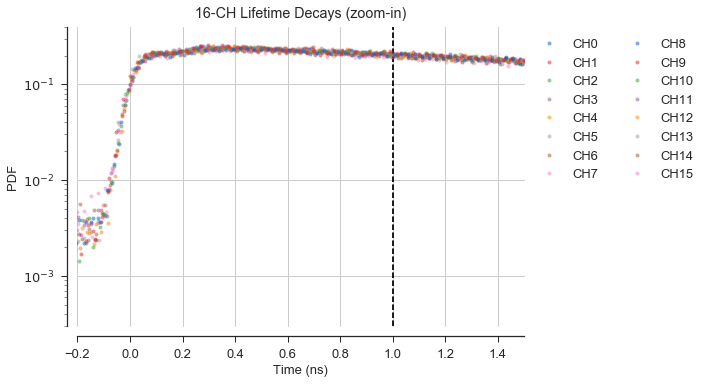

In [123]:
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns0[i], pdf=pdf)
    plt.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

plt.xlim(-3, 35)
plt.ylim(3e-4, 0.4)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(1, color='k', ls='--')
plt.axvline(18, color='k', ls='--')
sns.despine(trim=False, offset=10)
savefig('sm_inbursts_lifetime_decays_nolegend.png')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2);
savefig('sm_inbursts_lifetime_decays_legend.png')
display(plt.gcf())
plt.xlim(-0.2, 1.5)
plt.title('16-CH Lifetime Decays (zoom-in)', va='bottom');

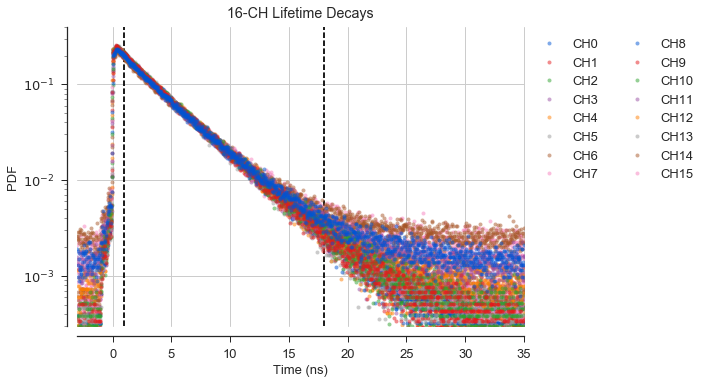

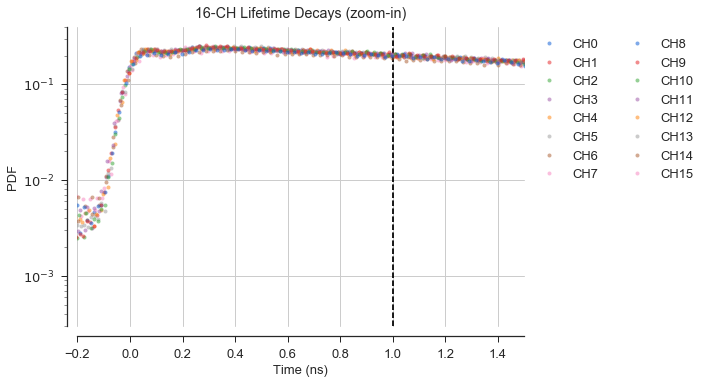

In [124]:
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = d.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns_dsw[i], pdf=pdf)
    plt.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

plt.xlim(-3, 35)
plt.ylim(3e-4, 0.4)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(1, color='k', ls='--')
plt.axvline(18, color='k', ls='--')
sns.despine(trim=False, offset=10)
savefig('sm_inbursts_lifetime_decays_nolegend.png')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2);
savefig('sm_inbursts_lifetime_decays_legend.png')
display(plt.gcf())
plt.xlim(-0.2, 1.5)
plt.title('16-CH Lifetime Decays (zoom-in)', va='bottom');

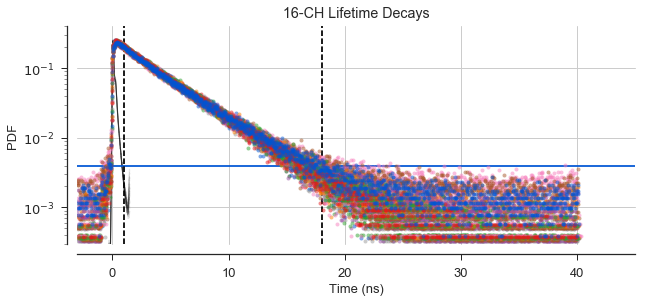

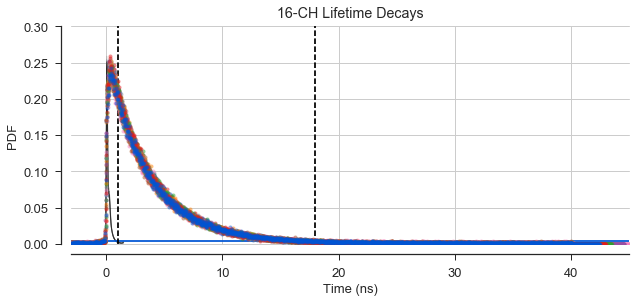

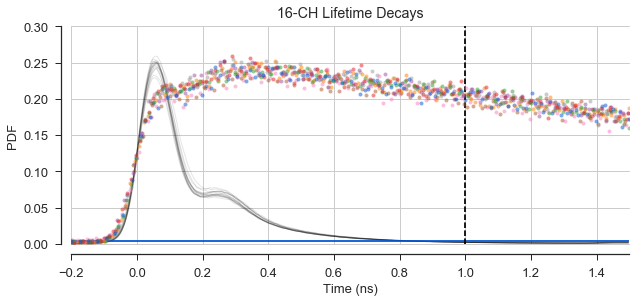

(0.0001, 0.4)

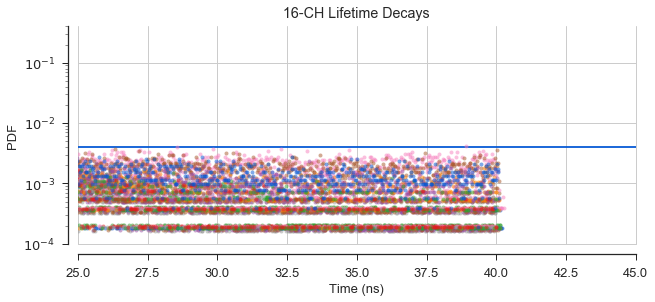

In [125]:
t1, t2 = 1, 18
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns_dsw[i], pdf=pdf)
    ax.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    ax.plot(x_irf, irf_pdf / irf_pdf.max() * counts.max(), color='k', alpha=0.1, lw=1)
    
plt.xlim(-3, 45)
plt.ylim(3e-4, 0.4)
plt.axhline(4*1e-3)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(t1, color='k', ls='--')
plt.axvline(t2, color='k', ls='--')
plt.title('16-CH Lifetime Decays', va='bottom');
sns.despine(trim=False, offset=10)
display(fig)

plt.yscale('linear')
plt.ylim(0, 0.3)
display(fig)

plt.xlim(-0.2, 1.5)
display(fig)

plt.yscale('log')
plt.xlim(25, 45)
plt.ylim(1e-4, 0.4)

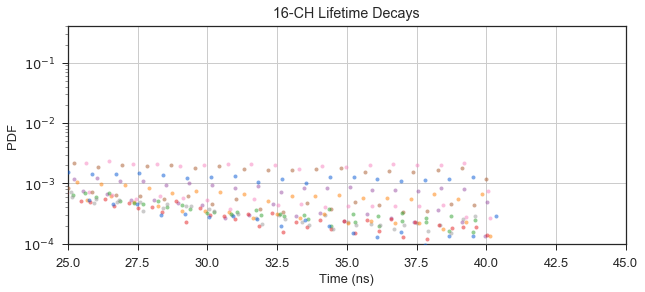

In [126]:
t1, t2 = 1, 18
pdf = True
kws = dict(marker='o', ms=4, lw=0, alpha=0.5)
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
for i in range(16):
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=256, offset=offset_ns0[i], pdf=pdf)
    ax.plot(t, counts, zorder=20-i, label='CH%d' % i, **kws)

    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[i],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[i], **irf_kws)
    ax.plot(x_irf, irf_pdf / irf_pdf.max() * counts.max(), color='k', alpha=0.1, lw=1)
    
plt.xlim(25, 45)
plt.ylim(1e-4, 0.4)
plt.yscale('log')
plt.xlabel('Time (ns)')
plt.ylabel('PDF' if pdf else '# Photons')
plt.title('16-CH Lifetime Decays', va='bottom');
plt.grid(True)
plt.axvline(t1, color='k', ls='--')
plt.axvline(t2, color='k', ls='--')

In [127]:
# bins_r=np.arange(0, 2**14, 8)
# #hist_params = dict(histtype='step', alpha=0.6, lw=1.5)
# kws = dict(marker='o', ms=3, lw=0, alpha=0.5)
# for i in range(16):
#     unit = tcspc_unit[i] * 1e9
#     ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
#     ntimes = d.nanotimes[i][ph_in_bursts_mask] * unit
#     counts, bins = np.histogram(ntimes - offset_ns[i], bins=bins_r*unit, density=True)
#     plt.plot(bins[1:], counts, zorder=20-i, label='CH%d' % i, **kws)

# plt.xlim(5, 48)
# plt.ylim(3e-4, 0.4)
# plt.yscale('log')
# plt.xlabel('Time (ns)')
# plt.ylabel('Probability')
# plt.title('16-CH Lifetime Decays', va='bottom');
# plt.axvline(9, color='k')
# plt.axvline(30, color='k')
# sns.despine(trim=False, offset=10)
# savefig('sm_inbursts_lifetime_decays.png')
# plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2);
# savefig('sm_inbursts_lifetime_decays_legend.png')

## Burst mean lifetime

In [128]:
def calc_mean_lifetime(dx, t1=0, t2=np.inf, ph_sel=Ph_sel('all'), offsets=None):
    """Compute the mean lifetime in each burst.

    Arguments:
        t1, t2 (floats): min and max value (in seconds) for the
            nanotime to be included in the mean
        ph_sel (Ph_sel object): object defining the photon selection.
            See :mod:`fretbursts.ph_sel` for details.

    Returns:
        List of arrays of per-burst mean lifetime in seconds. One array per channel.
    """
    if offsets is None:
        offsets = np.zeros(d.nch)
    mean_lifetimes = []
    units = [p['tcspc_unit'] for p in dx.nanotimes_params]
    for ich, (bursts, nanot, mask) in enumerate(zip(dx.mburst, dx.nanotimes, dx.iter_ph_masks(ph_sel))):
        nanot_s = (nanot * units[ich]) - offsets[ich]
        selection = (nanot_s > t1) * (nanot_s < t2)
    
        # Select photons in ph_sel AND with nanotime in [t1, t2]
        if bl.isarray(mask):
            selection *= mask
        mean_lifetimes.append(
            bl.burst_ph_stats(nanot_s, bursts, mask=selection, func=np.mean) - t1
        )
    return mean_lifetimes

In [129]:
ds40 = d.select_bursts(select_bursts.size, th1=40)

In [130]:
t1, t2 = 1, 20
dx = ds
mlt = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widths = 0.9 * dx.num_bursts / dx.num_bursts.max()

In [131]:
t1, t2 = 1, 20
dx = ds40
mlt40 = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widths40 = 0.9 * dx.num_bursts / dx.num_bursts.max()

In [132]:
t1, t2 = 1, 20
dx = dsw
mltw = [m*1e9 for m in calc_mean_lifetime(dx, t1=t1*1e-9, t2=t2*1e-9, offsets=offset_ns0*1e-9)]
widthsw = 0.9 * dx.num_bursts / dx.num_bursts.max()

In [133]:
#import matplotlib.ticker

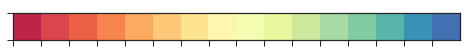

In [134]:
colors = sns.color_palette('Spectral', 16)
sns.palplot(colors, size=0.5)

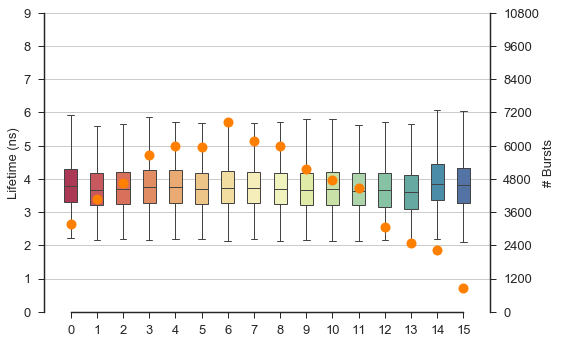

In [135]:
sns.boxplot(data=mlt, palette=colors, linewidth=1, width=0.5, whis=(1, 99), showfliers=False);
ax1 = plt.gca()
ax1.grid(axis='y')

nticks = 10
ax1.set(ylim=(0, nticks-1), ylabel='Lifetime (ns)')

ax2 = plt.twinx()
ax2.plot(ds.num_bursts, 'C4o', ms=10)
ax2.set(ylim=(0, (ds.num_bursts.max() / nticks // 100) * (nticks - 1) * 2 * 100), ylabel='# Bursts')

nticks = 10
ax1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax2.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
sns.despine(right=False, trim=True)

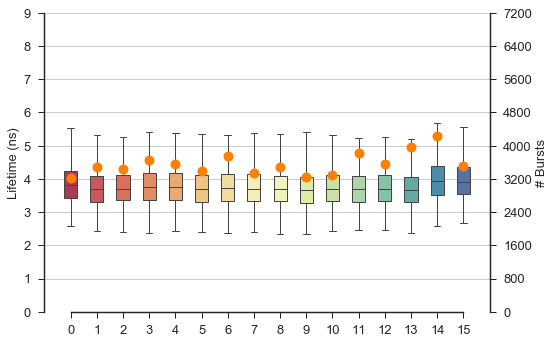

In [136]:
sns.boxplot(data=mltw, palette=colors, linewidth=1, width=0.5, whis=(1, 99), showfliers=False);
ax1 = plt.gca()
ax1.grid(axis='y')

nticks = 10
ax1.set(ylim=(0, nticks-1), ylabel='Lifetime (ns)')

ax2 = plt.twinx()
ax2.plot(dsw.num_bursts, 'C4o', ms=10)
ax2.set(ylim=(0, (dsw.num_bursts.max() / nticks // 100) * (nticks - 1) * 2 * 100), ylabel='# Bursts')

nticks = 10
ax1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax2.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
sns.despine(right=False, trim=True)

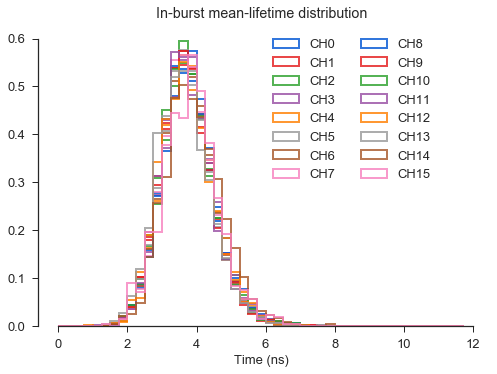

In [137]:
channels = range(16)
hist_params = dict(bins=np.arange(0, 12, 0.25), histtype='step', alpha=0.8, lw=2, normed=True)
for i in channels:
    meanlife = mlt[i][~np.isnan(mlt[i])]
    plt.hist(meanlife, label='CH%d'%i, **hist_params);

#plt.xlim(0, 12)
plt.xlabel('Time (ns)')
plt.title('In-burst mean-lifetime distribution', va='bottom');
plt.legend(bbox_to_anchor=(0.5, 1), loc='upper left', ncol=2);
sns.despine(trim=True)

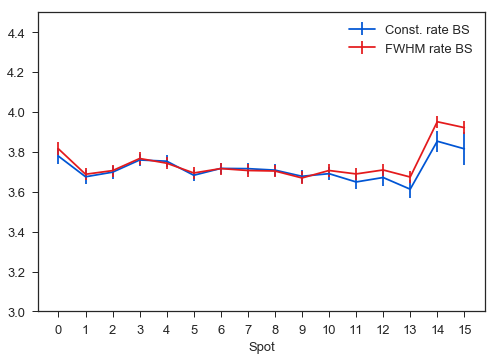

In [138]:
mean_life = mlt
ml_mean = [np.mean(m) for m in mean_life]
ml_median = [np.median(m) for m in mean_life]
ml_std = [3*np.std(m)/(np.sqrt(m.size)) for m in mean_life]
plt.errorbar(range(16), ml_median, yerr=ml_std, label='Const. rate BS');
plt.ylim(3, 4.5)
mean_life = mltw
ml_meanw = [np.mean(m) for m in mean_life]
ml_medianw = [np.median(m) for m in mean_life]
ml_stdw = [3*np.std(m)/(np.sqrt(m.size)) for m in mean_life]
plt.errorbar(range(16), ml_medianw, yerr=ml_stdw, label='FWHM rate BS');
plt.gca().set(ylim=(3, 4.5), xticks=(range(16)), xlabel='Spot')
plt.legend();

(3.7165539931345677, 0.060381861329420493)

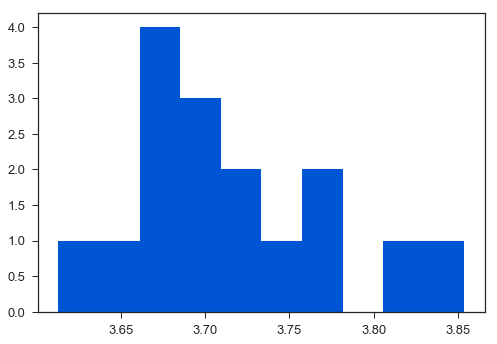

In [139]:
plt.hist(ml_median)
np.mean(ml_median), np.std(ml_median)

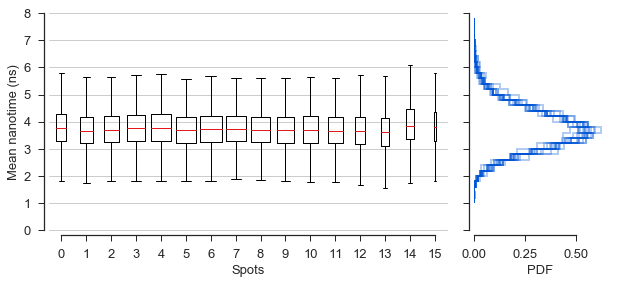

In [140]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.1)

ax[0].boxplot(mlt, positions=range(16), widths=widths);
ax[0].set(ylim=(0, 8), ylabel='Mean nanotime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8, 0.2),  normed=True, histtype='step', 
                   alpha=0.3, lw=2, color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, **hist_params);

ax[1].set(xlabel='PDF')
#ax[1].legend(bbox_to_anchor=(0.5, 1), loc='upper left', ncol=1);
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')

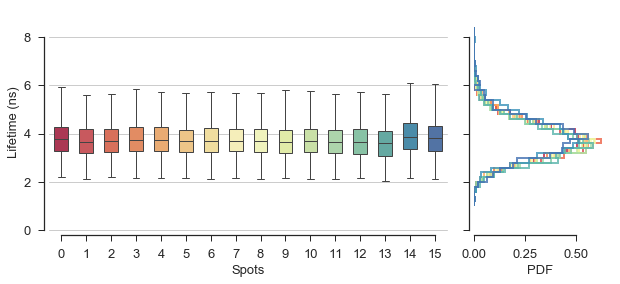

In [141]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.1)

sns.boxplot(data=mlt, ax=ax[0], whis=(1, 99), showfliers=False,
            palette=colors, linewidth=1, width=0.55);
ax[0].set(ylim=(0, 9), ylabel='Lifetime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8.6, 0.2),  normed=True, histtype='step', 
                   alpha=0.8, lw=2, #color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, color=colors[i], **hist_params);

ax[1].set(xlabel='PDF')
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')
savefig('burstlifetimes.png')

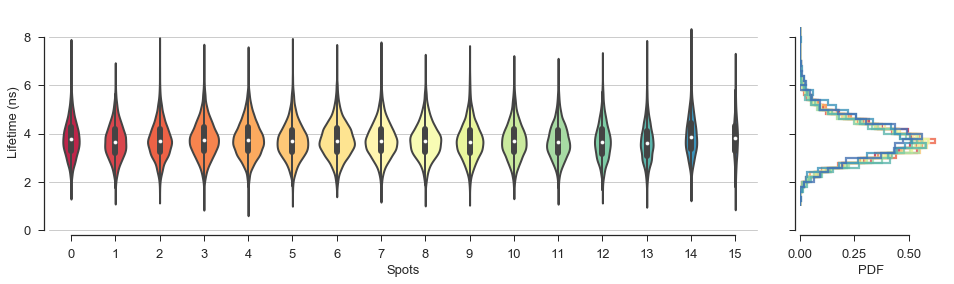

In [142]:
fig, ax = plt.subplots(1, 2, figsize=(16, 4), sharey=True, gridspec_kw={'width_ratios': [5, 1]})
plt.subplots_adjust(wspace=0.1)

sns.violinplot(data=mlt, ax=ax[0], saturation=1, scale='count',
               palette=colors, linewidth=2);
ax[0].set(ylim=(0, 9), ylabel='Lifetime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8.6, 0.2),  normed=True, histtype='step', 
                   alpha=0.8, lw=2.2, #color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, color=colors[i], **hist_params);

ax[1].set(xlabel='PDF')
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='y')
savefig('mean in-burst lifetime violin hist.png')

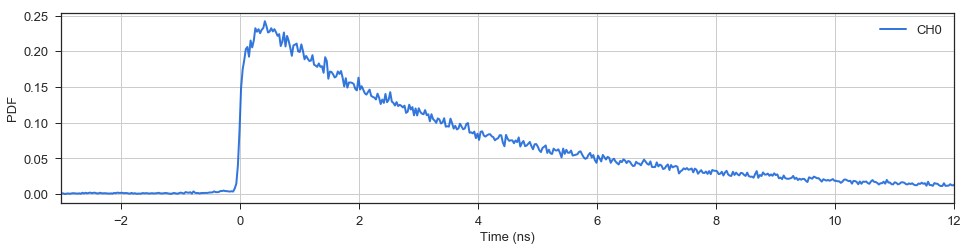

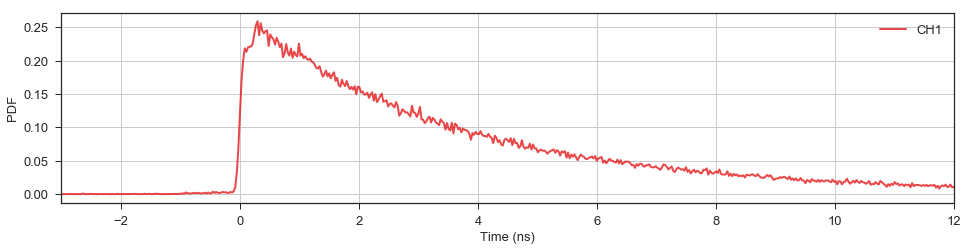

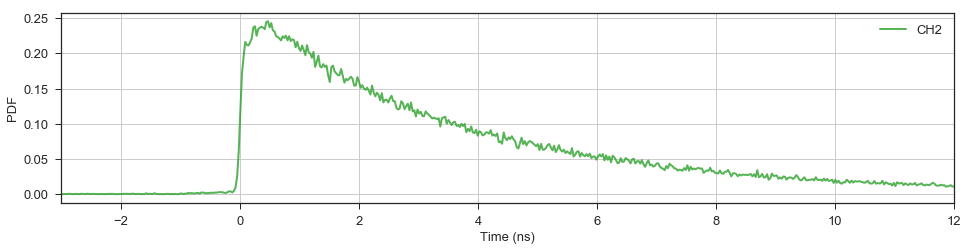

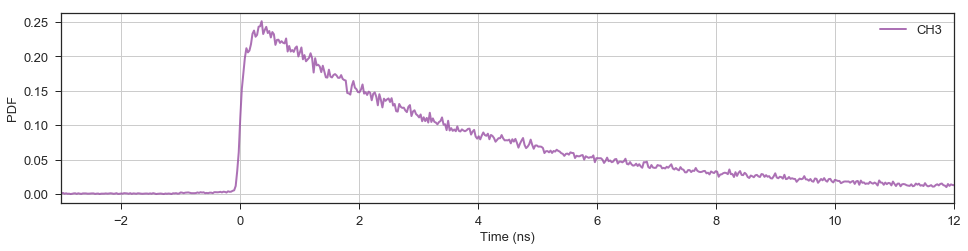

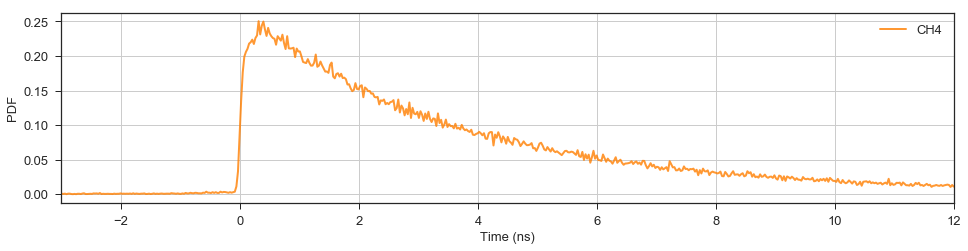

...

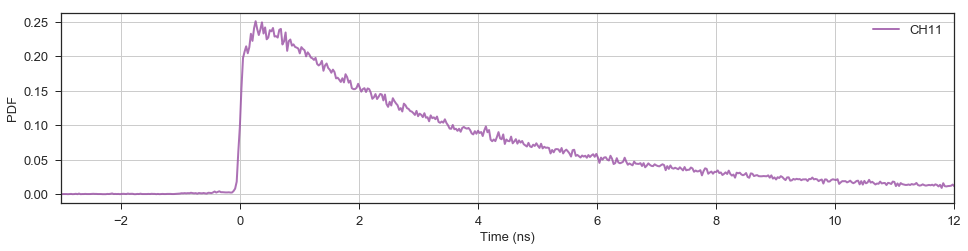

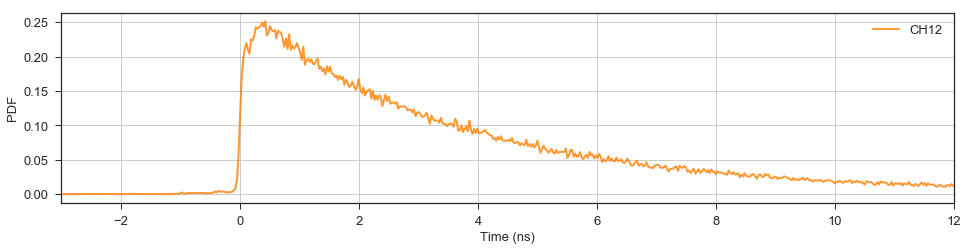

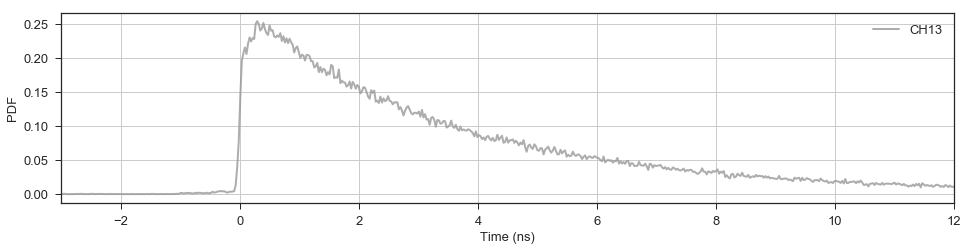

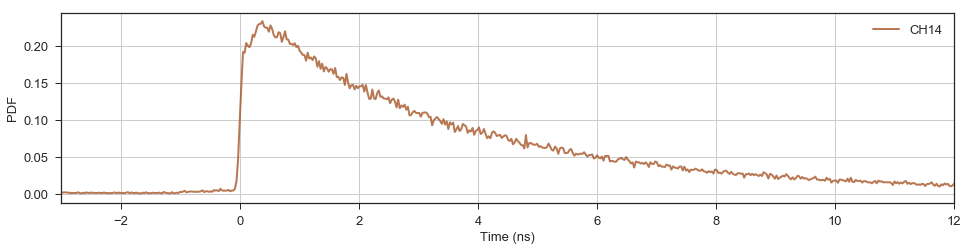

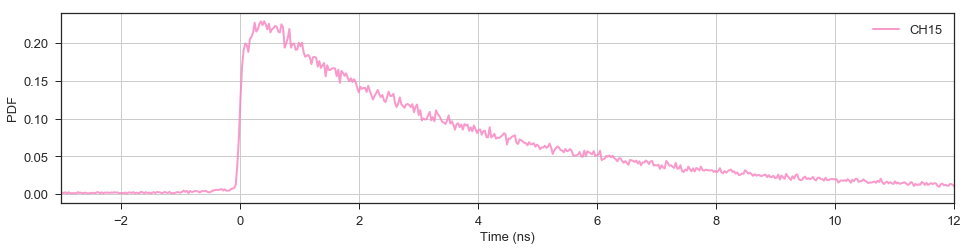

In [143]:
channels = range(16)
pdf = True
kws = dict(marker='o', ms=0, lw=2, alpha=0.8)
for i in channels:
    fig = plt.figure(figsize=(16, 3.5))
    unit = d.nanotimes_params[i]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dsw.ph_in_bursts_mask_ich(i)
    ntimes = d.nanotimes[i][ph_in_bursts_mask]
    t, counts = tcspc.calc_nanotime_hist(ntimes, unit, idxmax=2**14, rebin=8, offset=offset_ns0[i], pdf=pdf)

    plt.plot(t, counts, label='CH%d' % i, color='C%d' % (i % 8), **kws)
    plt.legend()
    plt.grid(True)
    #plt.yscale('log')
    plt.xlabel('Time (ns)')
    plt.ylabel('PDF' if pdf else '# Photons')
    plt.xlim(-3, 12);

## Population Lifetim Fit

### Tail Fit

In [144]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [145]:
import lmfit
lmfit.__version__

'0.9.5'

In [146]:
import pybroom as br

In [147]:
pd.options.display.max_rows = 16

In [148]:
def func_exp_baseline2(t, tau, ampl1, ampl2):
    return ampl1 * np.exp(-t/tau) + ampl2

def func_exp_baseline(t, tau, alpha, ts, ampl):
    return ampl * pdf_exp_baseline(t, tau, alpha, ts)

def pdf_exp_baseline(t, tau, alpha, ts):
    return alpha * (np.exp(-t/tau) / tau) + (1-alpha) / ts

def logll_exp_baseline(t, tau, alpha, ts):
    return np.log(pdf_exp_baseline(t, tau, alpha, ts)).sum()

def minimze_loglike(params, t, ts):
    tau = params['tau'].value
    alpha = params['alpha'].value
    return logll_exp_baseline(t, tau, alpha, ts)

def hist_residuals(params, hist_data, bin_centers, weight=False):
    residuals = (hist_data - func_exp_baseline2(bin_centers, **params.valuesdict()))
    if weight:
        weights = 1/(np.sqrt(hist_data) + 0.1)
        residuals *= weights
    return residuals

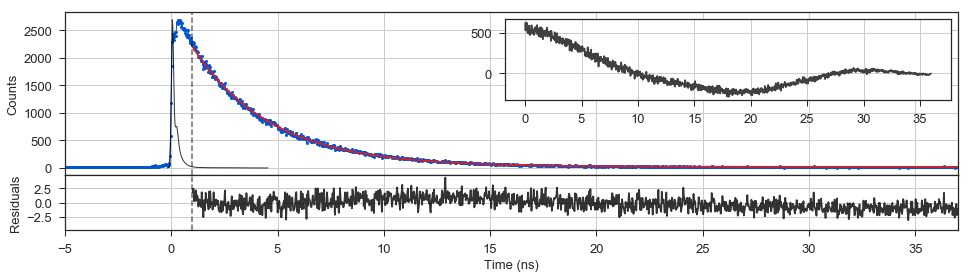

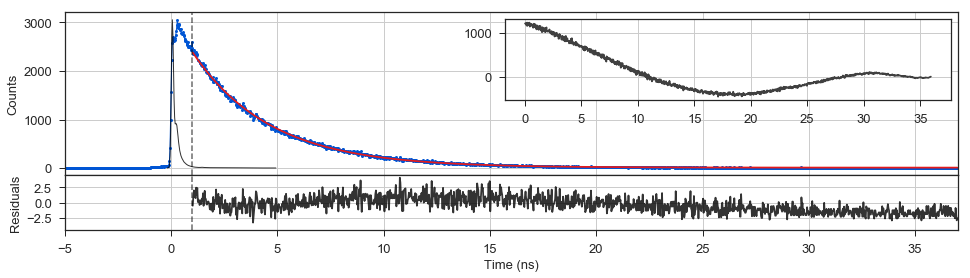

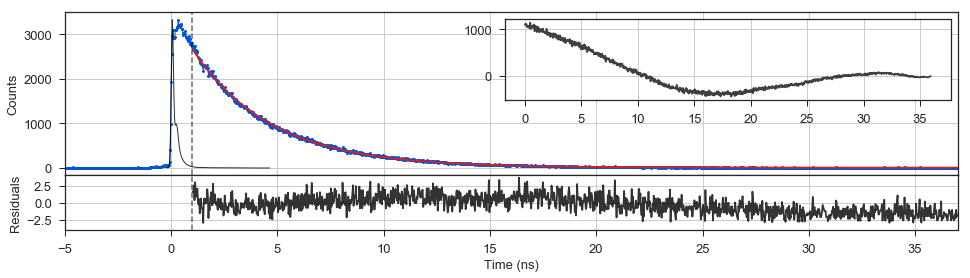

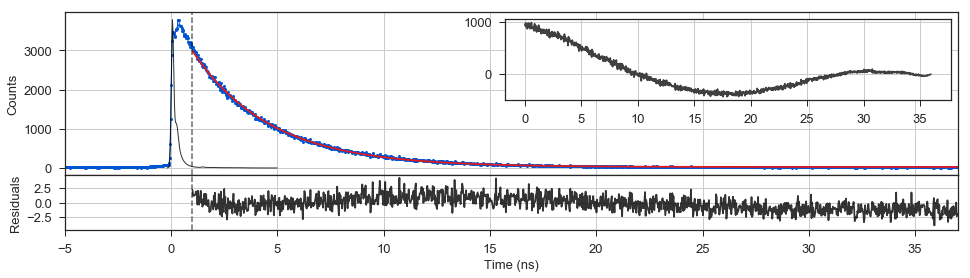

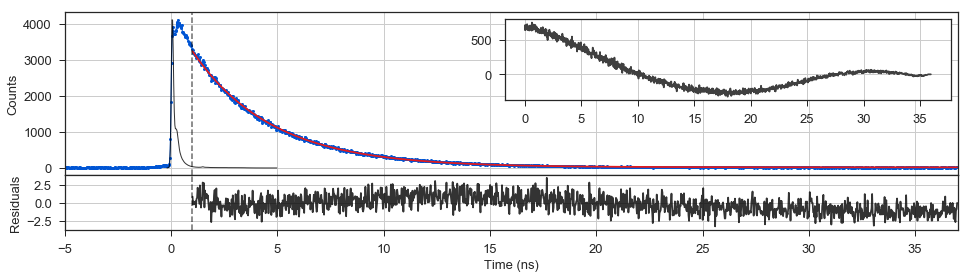

...

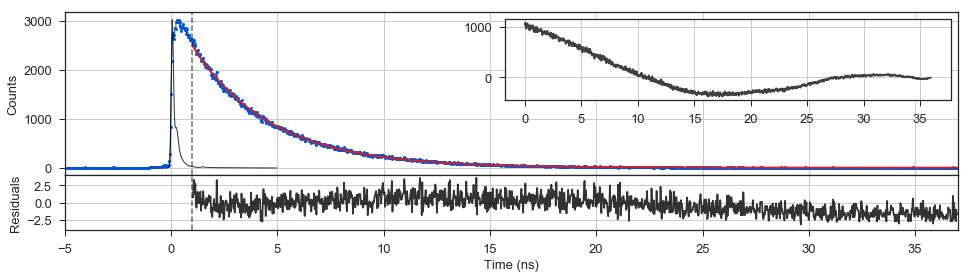

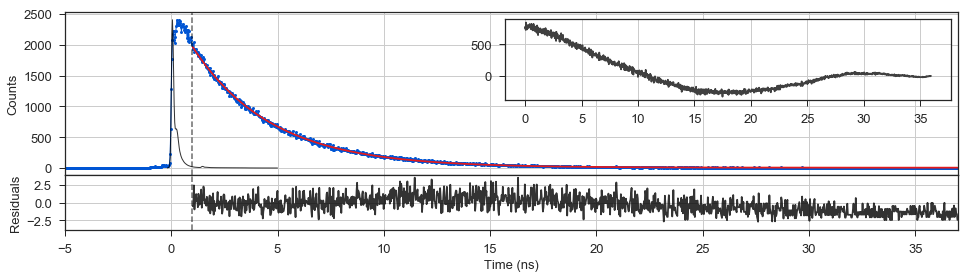

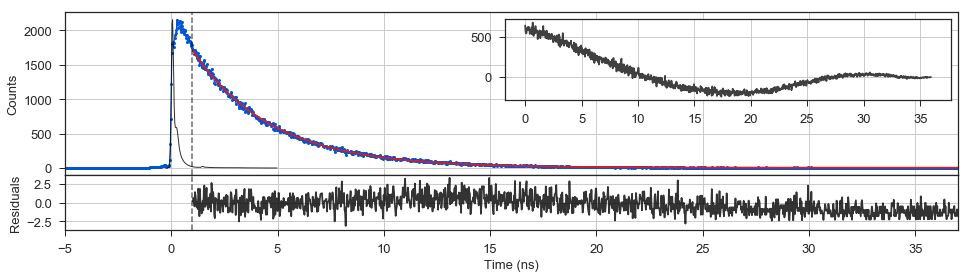

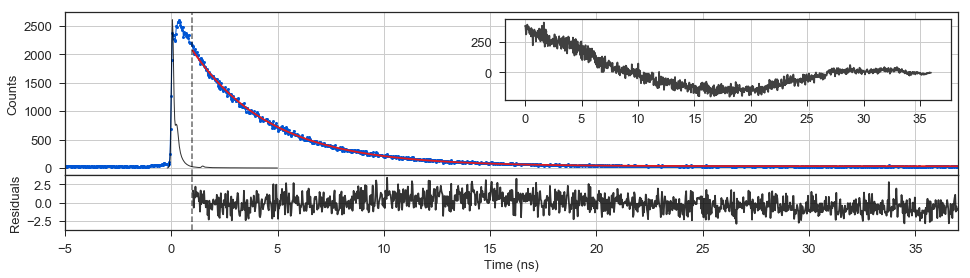

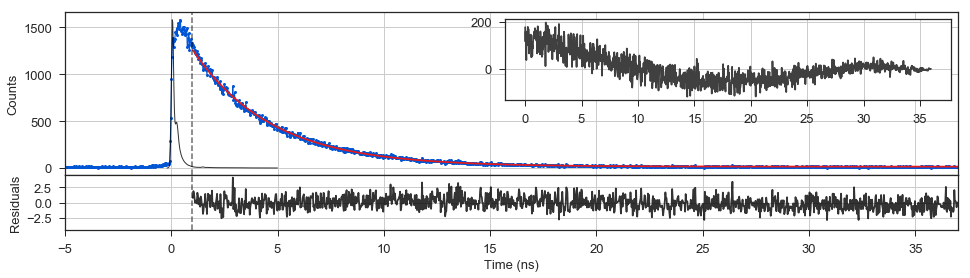

In [149]:
t1, t2 = 1, 37
weight = False
dx = d
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau', min=1, max=9, value=4)
params0.add('ampl1', min=0, value=1000)
params0.add('ampl2', min=0, value=10)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 5      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich], pdf=False)
    bins_c, lifet_hist = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
    hist_mask = (bins_c >= t1) * (bins_c <= t2)
    x_model = bins_c[hist_mask]
    lifet_hist_sel = lifet_hist[hist_mask]#.astype('float')
    
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'hist_data': lifet_hist_sel, 'bin_centers': x_model - t1, 'weight': weight}
    res = lmfit.minimize(hist_residuals, params0, kws=fitfunc_kws, method='melder')
    res_bulk[ich] = res
    
    y_model = func_exp_baseline2(x_model - t1,  **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(bins_c, lifet_hist, label='CH%d data' % ich, **kws)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist.max(), color='k', alpha=0.8, lw=1)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    #ax[1].set_ylim(-60, 60)
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(-5, t2)
    ax[0].legend()
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [150]:
popfitg = br.glance(res_bulk, var_names='spot')
popfit = br.tidy(res_bulk, var_names='spot')

In [151]:
popfit

,name,value,min,max,vary,expr,stderr,init_value,spot
0,ampl1,2180.057858,0,inf,True,NaN,NaN,1000.999500,0
1,ampl2,20.954438,0,inf,True,NaN,NaN,10.954451,0
2,tau,3.663942,1,9.000000,True,NaN,NaN,-0.252680,0
3,ampl1,2383.528066,0,inf,True,NaN,NaN,1000.999500,1
4,ampl2,8.418221,0,inf,True,NaN,NaN,10.954451,1
5,tau,3.657987,1,9.000000,True,NaN,NaN,-0.252680,1
6,ampl1,2660.154581,0,inf,True,NaN,NaN,1000.999500,2
7,ampl2,10.226102,0,inf,True,NaN,NaN,10.954451,2
...,...,...,...,...,...,...,...,...,...
40,ampl2,4.928945,0,inf,True,NaN,NaN,10.954451,13


In [152]:
popfitgs = br.glance(res_bulk, var_names='spot')
popfits = br.tidy(res_bulk, var_names='spot')

3.6835701460646648

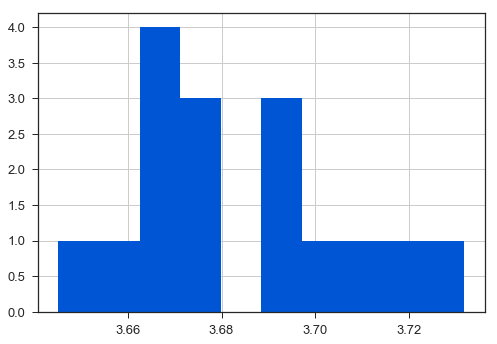

In [153]:
popfit.loc[popfit.name == 'tau']['value'].hist()
popfit.loc[popfit.name == 'tau']['value'].mean()

(3.2, 4)

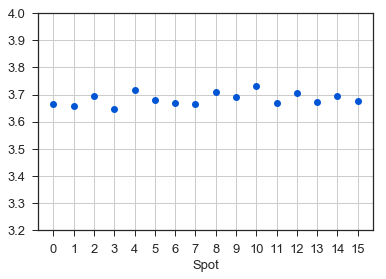

In [154]:
linplot16(np.array(popfit.loc[popfit.name == 'tau', 'value']))
plt.ylim(3.2, 4)

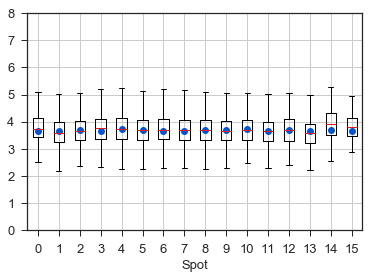

In [155]:
linplot16(np.array(popfit.loc[popfit.name == 'tau', 'value']))
plt.ylim(0, 8)
plt.boxplot(mlt40, positions=range(16));

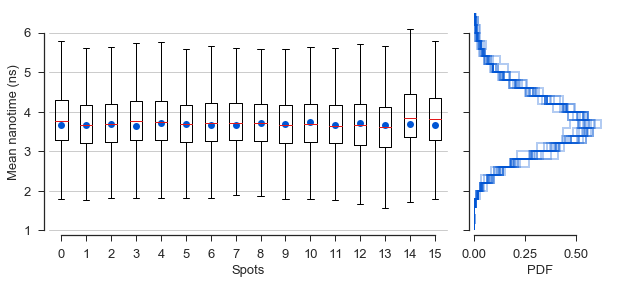

In [156]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True, gridspec_kw={'width_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.1)

ax[0].boxplot(mlt, positions=range(16));
linplot16(np.array(popfit.loc[popfit.name == 'tau', 'value']), ax=ax[0])
ax[0].set(ylim=(1, 6.5), ylabel='Mean nanotime (ns)', xlabel='Spots')

channels = range(16)
hist_params = dict(bins=np.arange(1, 8, 0.2),  normed=True, histtype='step', 
                   alpha=0.3, lw=2, color='C0',
                   orientation='horizontal')
for i in channels:
    meanlife = mlt[i]
    ax[1].hist(meanlife, label='CH%d'%i, **hist_params);

ax[1].set(xlabel='PDF')
#ax[1].legend(bbox_to_anchor=(0.5, 1), loc='upper left', ncol=1);
for a in ax:
    sns.despine(ax=a, trim=True, offset=5)
plt.setp(a.get_yticklabels(), visible=False);
ax[0].grid(axis='x')

### Convolution Fit

In [157]:
def model_1exp_conv(x, tau, ampl, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl*np.exp(-(x[pos_range] - offset)/tau)
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z

def model_2exp_conv(x, tau1, ampl1, tau2, ampl2, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl1*(np.exp(-(x[pos_range] - offset)/tau1)) + \
                   ampl2*(np.exp(-(x[pos_range] - offset)/tau2))
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z

def model_3exp_conv(x, tau1, ampl1, tau2, ampl2, tau3, ampl3, baseline, offset, irf):
    """
    Model function used to fit the data.
    """
    y = np.zeros(x.size)
    pos_range = (x - offset) >= 0
    y[pos_range] = ampl1*(np.exp(-(x[pos_range] - offset)/tau1)) + \
                   ampl2*(np.exp(-(x[pos_range] - offset)/tau2)) + \
                   ampl3*(np.exp(-(x[pos_range] - offset)/tau3))
    z = np.convolve(y, irf, mode='same')
    z += baseline
    return z


def residuals_func(params, x, y, weight, irf, model_func):
    """
    Returns the array of residuals for the current parameters.
    """
    resid = (y - model_func(x, irf=irf, **params.valuesdict()))
    if weight:
        resid /= np.sqrt(y + 1)
    return resid

#### 1-exponential

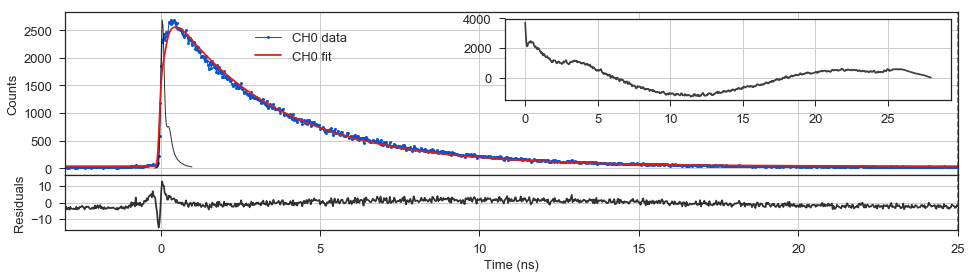

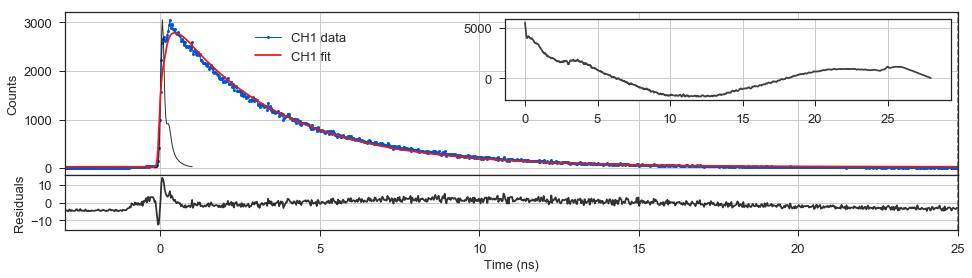

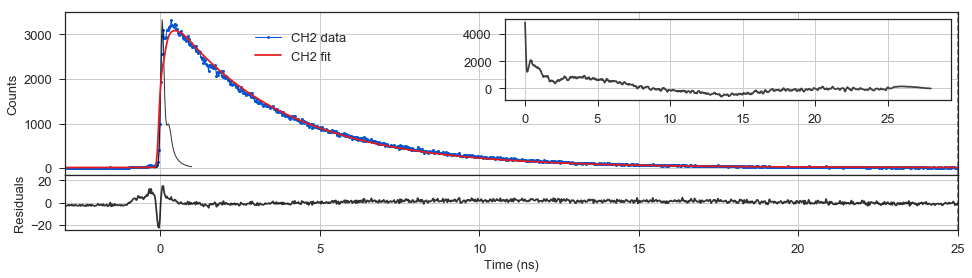

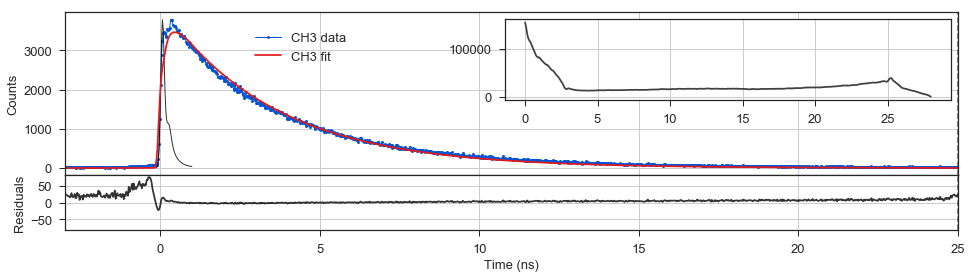

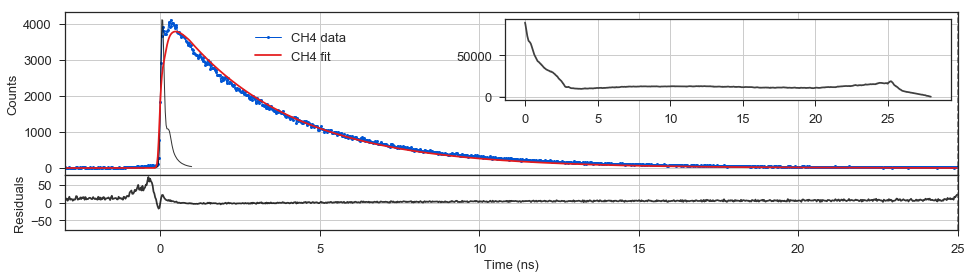

...

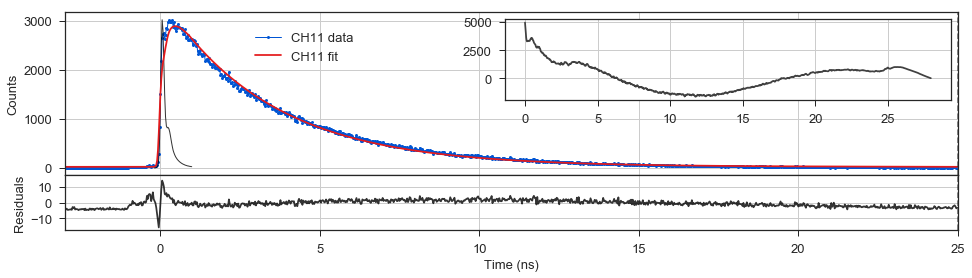

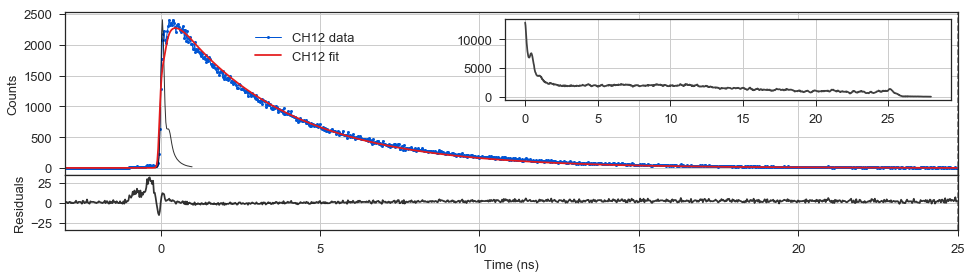

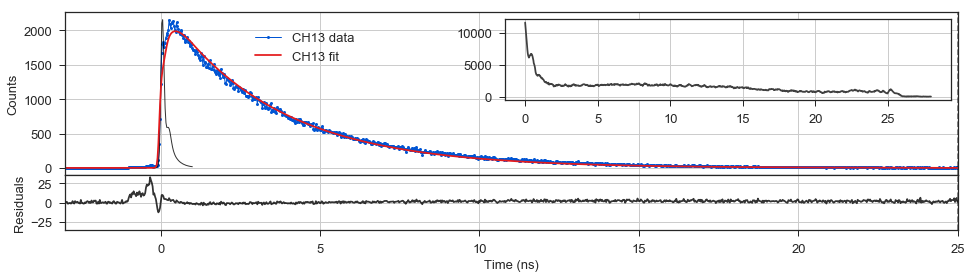

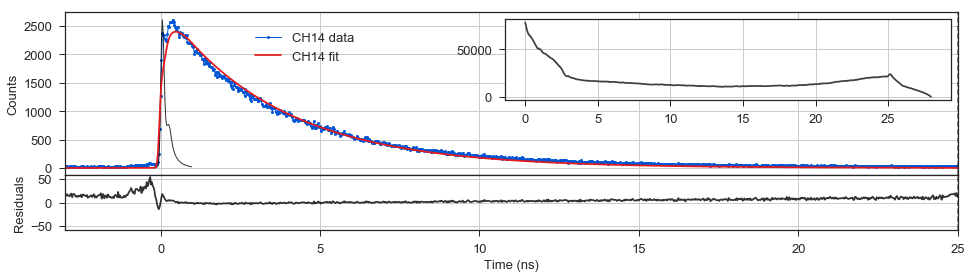

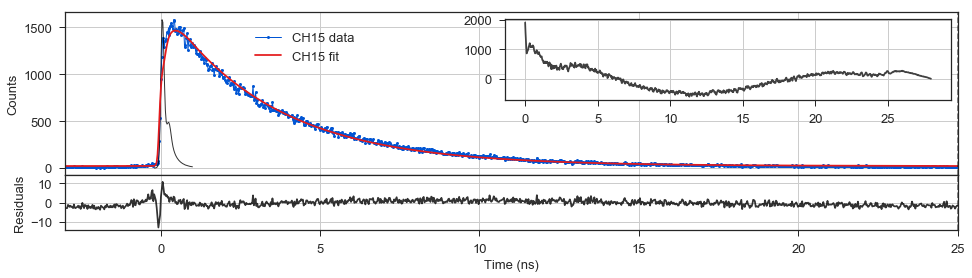

In [158]:
t1, t2 = -3, 25
dx = d
weight = False
model = model_1exp_conv
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau', min=1, max=9, value=3.6)
params0.add('ampl', min=0, value=50)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=2)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 1      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws) 
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [159]:
popcfitg = br.glance(res_bulk, var_names='spot')
popcfit = br.tidy(res_bulk, var_names='spot')

(2.5, 4)

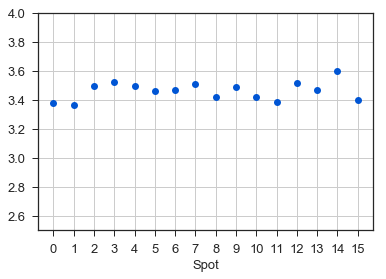

In [160]:
linplot16(np.array(popcfit.loc[popcfit.name == 'tau', 'value']))
plt.ylim(2.5, 4)

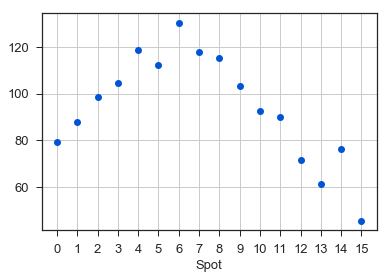

In [161]:
linplot16(np.array(popcfit.loc[popcfit.name == 'ampl', 'value']))

#### 2-exponential

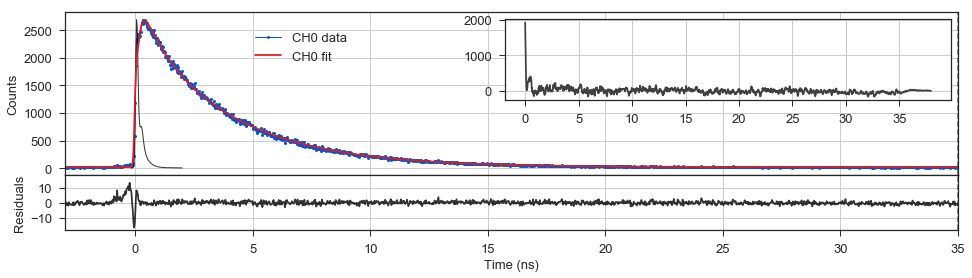

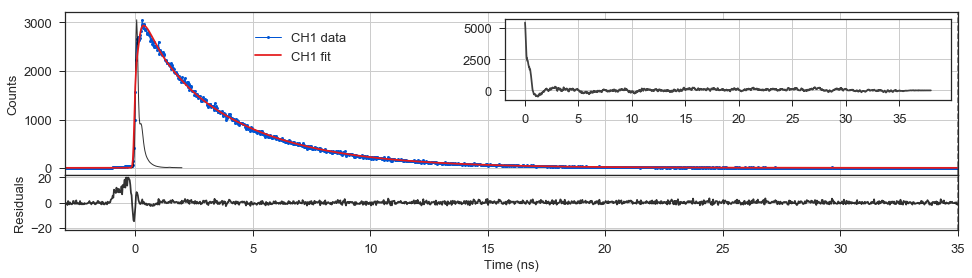

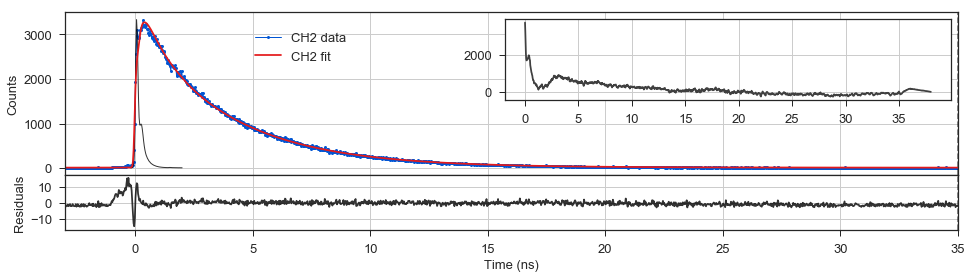

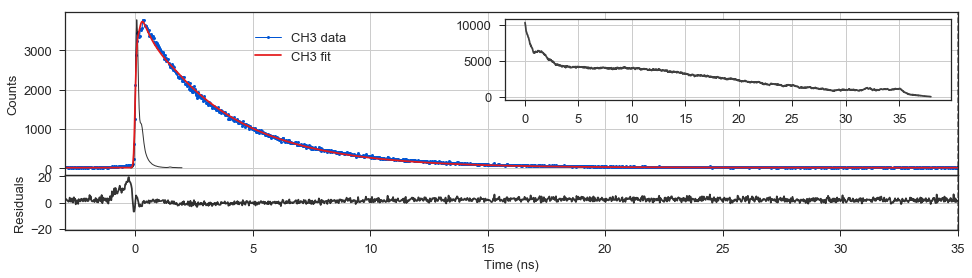

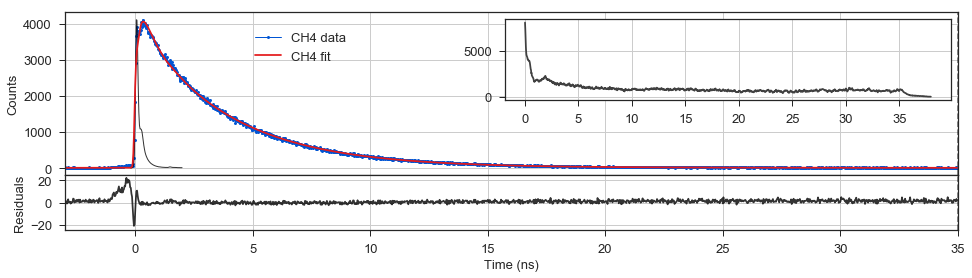

...

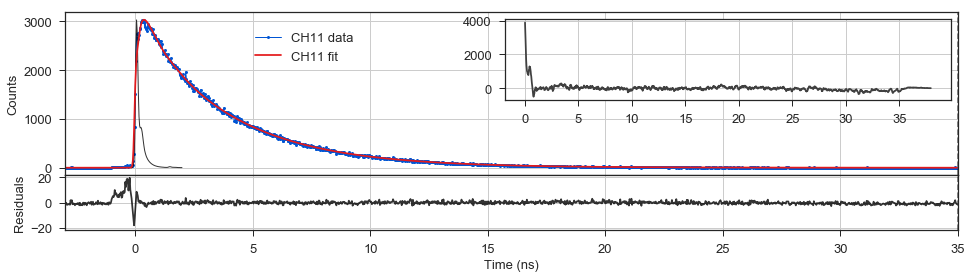

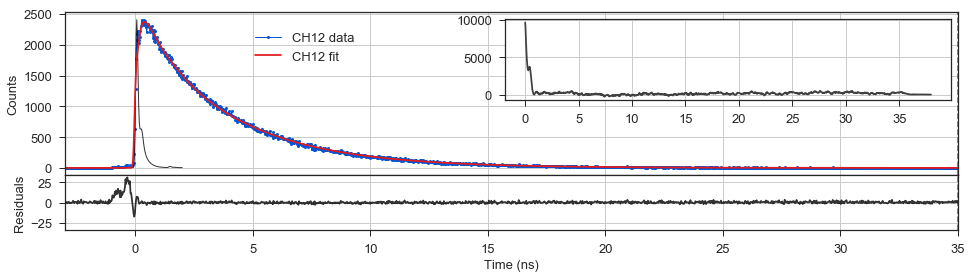

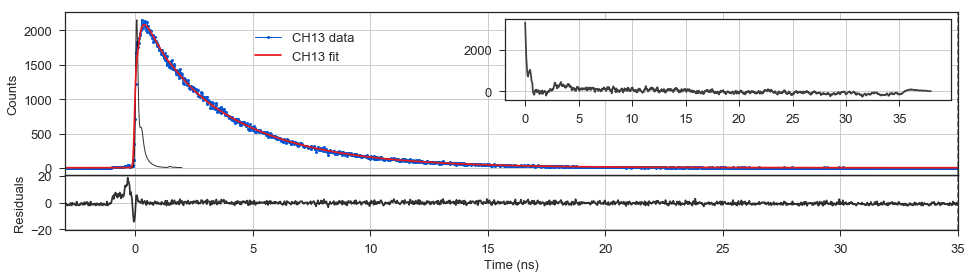

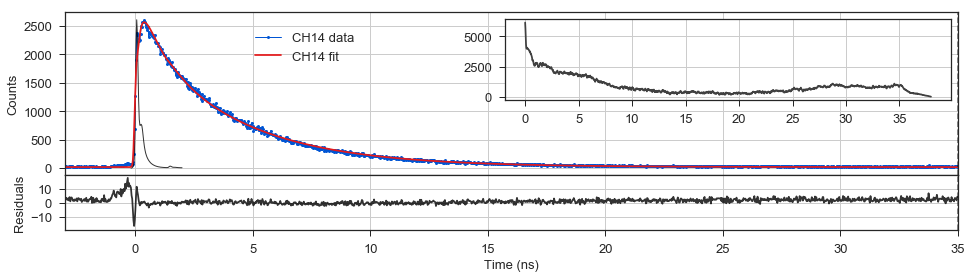

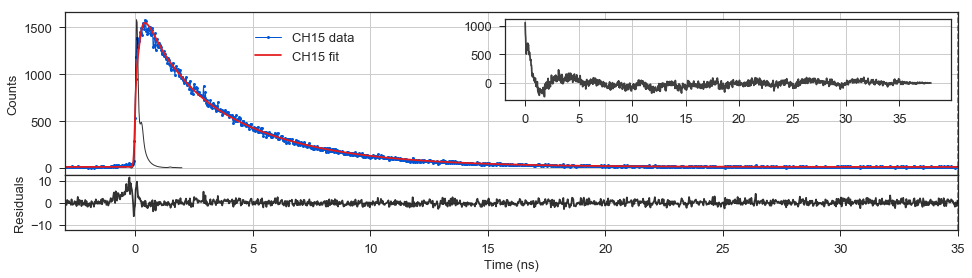

In [162]:
t1, t2 = -3, 35
dx = d
weight = False
model = model_2exp_conv
params0 = lmfit.Parameters()
params0.add('tau1', min=0, max=1.5, value=0.8)
params0.add('ampl1', min=0, value=10)
params0.add('tau2', min=3, max=6, value=3.6)
params0.add('ampl2', min=0, value=20)
params0.add('baseline', min=0, value=10)
params0.add('offset', value=2)
rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 2      # ns, end time of the IRF from t @ 0.5 of peak value

channels = range(16)
fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    #res = lmfit.minimize(residuals_func, res.params, kws=fitfunc_kws, method='leastsq')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [163]:
popcfitg2 = br.glance(res_bulk, var_names='spot')
popcfit2 = br.tidy(res_bulk, var_names='spot')

(0, 5)

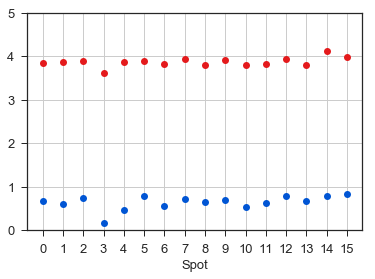

In [164]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'tau1', 'value']))
linplot16(np.array(popcfit2.loc[popcfit2.name == 'tau2', 'value']), ax=plt.gca())
plt.ylim(0, 5)

In [165]:
basepar = ('ampl', 'tau')
parnames = ['%s%d' % (x, i) for i in (1, 2) for x in basepar] + ['offset', 'baseline']
df = pd.DataFrame(dict(**{par: np.array(popcfit2.loc[popcfit2.name == par, 'value']) for par in parnames},
                       **{par+'_std': np.array(popcfit2.loc[popcfit2.name == par, 'stderr']) for par in parnames}))
df.head()

,ampl1,ampl1_std,ampl2,ampl2_std,baseline,baseline_std,offset,offset_std,tau1,tau1_std,tau2,tau2_std
0,22.236489,NaN,69.148315,NaN,18.658248,NaN,0.819672,NaN,0.669672,NaN,3.850679,NaN
1,29.061303,NaN,76.173437,NaN,3.618059,NaN,0.777802,NaN,0.603280,NaN,3.872657,NaN
2,30.458556,NaN,84.670485,NaN,10.015305,NaN,0.827293,NaN,0.734716,NaN,3.895656,NaN
3,70.706761,NaN,97.639032,NaN,12.581990,NaN,0.828202,NaN,0.165632,NaN,3.625774,NaN
4,49.422555,NaN,104.690231,NaN,9.709537,NaN,0.794597,NaN,0.462763,NaN,3.866636,NaN


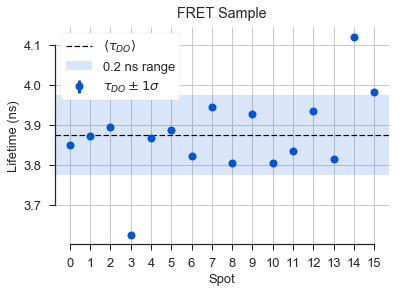

In [166]:
linplot16(df.tau2, kind='errorbar', yerr=df.tau2_std, marker='o', ms=8, lw=0, elinewidth=3, 
          title='FRET Sample', label=r'$\tau_{DO} \pm 1\sigma$')
#plt.ylim(3.4, 3.8001)
plt.axhline(df.tau2.mean(), ls='--', color='k', lw=1.2, label=r'$\langle\tau_{DO}\rangle$')
plt.axhspan(df.tau2.mean() - 0.1, df.tau2.mean() + 0.1, alpha=0.15, label='0.2 ns range')
plt.ylabel('Lifetime (ns)')
leg = plt.legend(frameon=True)#, loc='center left', bbox_to_anchor=(1, 0.5))
leg.get_frame().set(alpha=1)
sns.despine(trim=True, offset=0)

(0, 5)

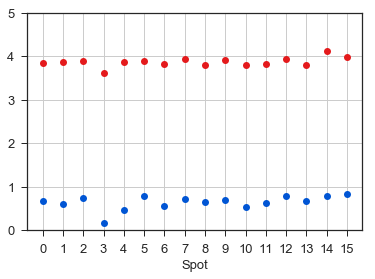

In [167]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'tau1', 'value']))
linplot16(np.array(popcfit2.loc[popcfit2.name == 'tau2', 'value']), ax=plt.gca())
plt.ylim(0, 5)
# t1, t2 = -3, 35
# dx = d
# weight = False
# model = model_2exp_conv
# params0 = lmfit.Parameters()
# params0.add('tau1', min=0, max=1.5, value=0.8)
# params0.add('ampl1', min=0, value=10)
# params0.add('tau2', min=3, max=6, value=3.6)
# params0.add('ampl2', min=0, value=20)
# params0.add('baseline', min=0, value=10)
# params0.add('offset', value=2.5)
# rebin = 8
# imin, imax = 1000, 5000
# irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
# irf_stop = 2      # ns, end time of the IRF from t @ 0.5 of peak value


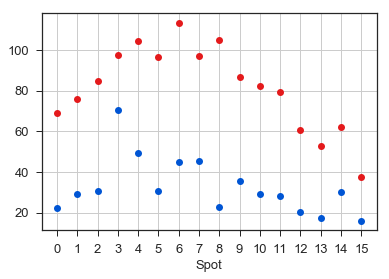

In [168]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'ampl1', 'value']))
linplot16(np.array(popcfit2.loc[popcfit2.name == 'ampl2', 'value']), ax=plt.gca())

(0, 1)

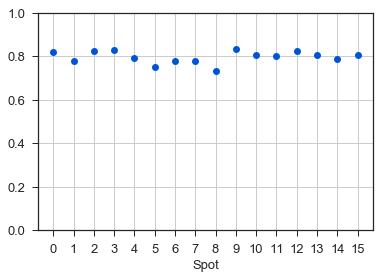

In [169]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'offset', 'value']))
plt.ylim(0, 1)

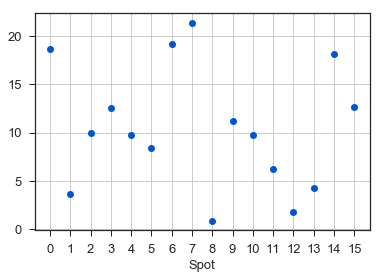

In [170]:
linplot16(np.array(popcfit2.loc[popcfit2.name == 'baseline', 'value']))

#### 3-exponential

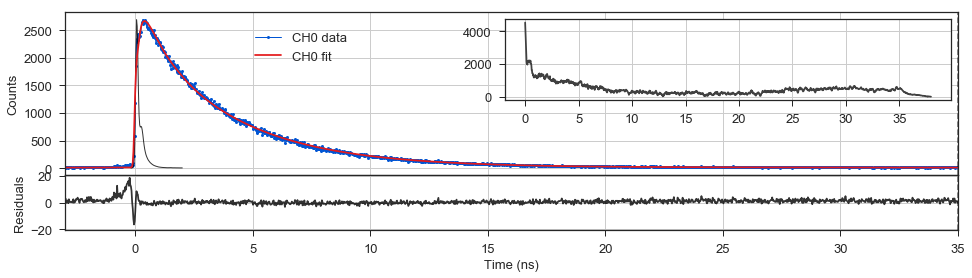

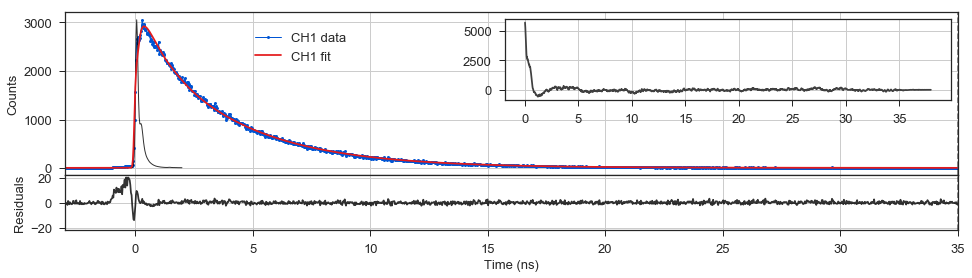

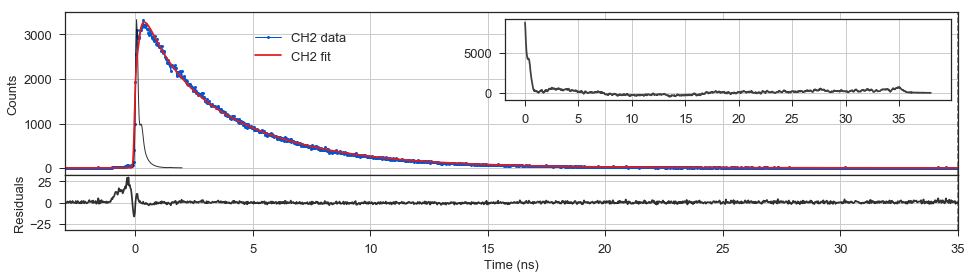

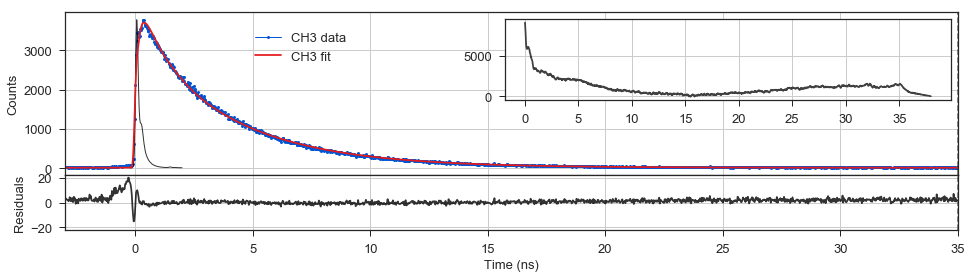

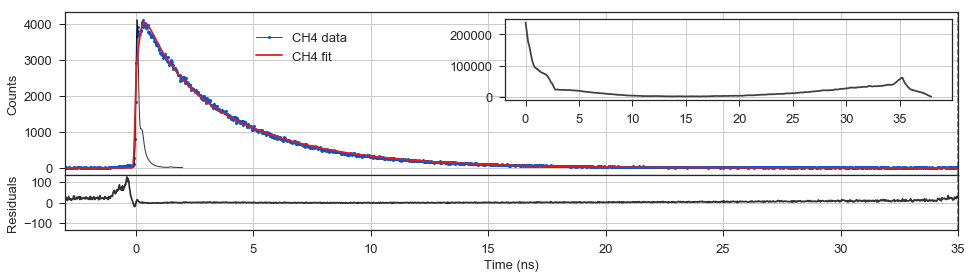

...

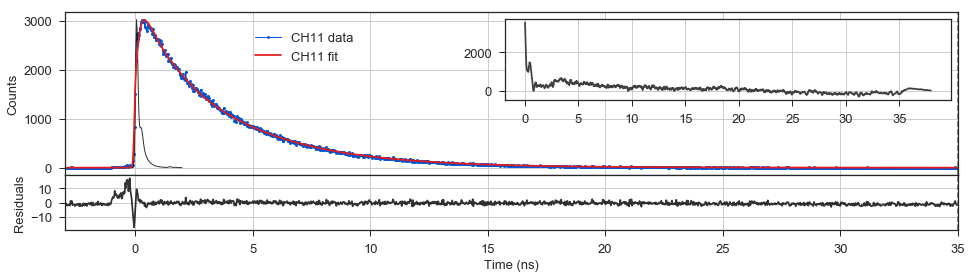

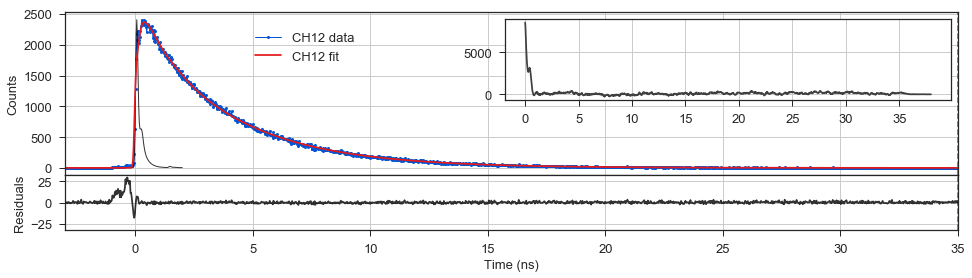

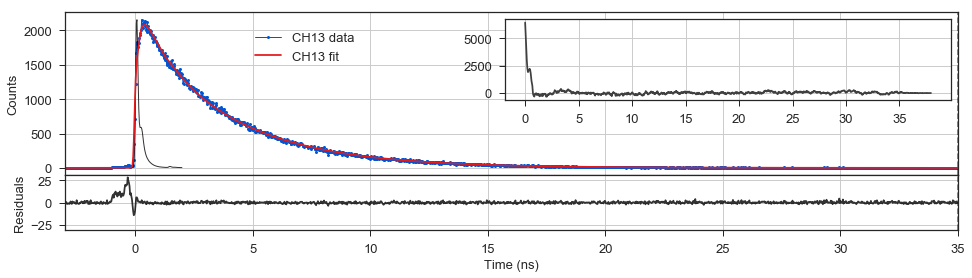

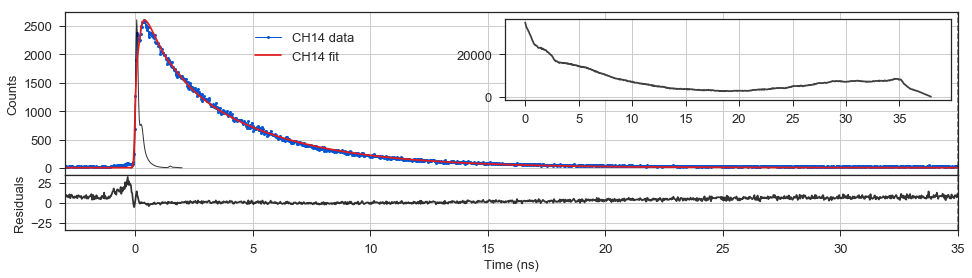

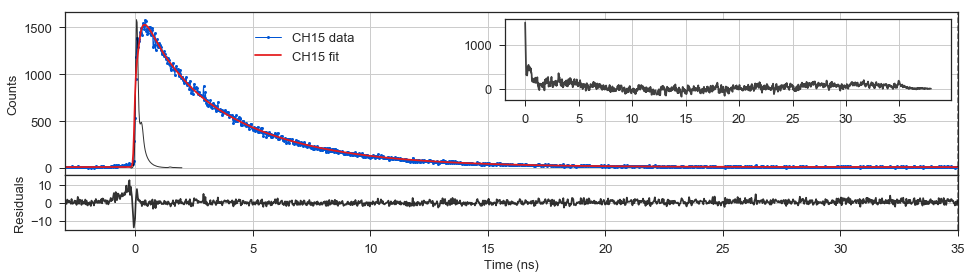

In [171]:
t1, t2 = -3, 35
dx = d
weight = False
model = model_3exp_conv
channels = range(16)

fig = plt.figure(figsize=(16, 3.5))
kws = dict(marker='o', ms=3, lw=1, alpha=1)

params0 = lmfit.Parameters()
params0.add('tau1', min=0.0, max=0.05, value=0.001)
params0.add('ampl1', min=0, value=0.5)
params0.add('tau2', min=0.1, max=1.5, value=0.8)
params0.add('ampl2', min=0, value=5)
params0.add('tau3', min=2, max=6, value=3.6)
params0.add('ampl3', min=0, value=5)
params0.add('baseline', min=0, value=1)
params0.add('offset', value=2.5)

rebin = 8
imin, imax = 1000, 5000
irf_start = -0.2  # ns, start of IRF from t @ 0.5 of peak value
irf_stop = 2      # ns, end time of the IRF from t @ 0.5 of peak value
res_bulk = [None] * 16
for ich in channels:
    unit = dx.nanotimes_params[ich]['tcspc_unit'] * 1e9
    ph_in_bursts_mask = dx.ph_in_bursts_mask_ich(ich)
    nanot = dx.nanotimes[ich][ph_in_bursts_mask]
    lifet_kws = dict(idxmax=2**14, rebin=rebin, unit=unit, offset=offset_ns0[ich],
                     t_start=t1, t_stop=t2, pdf=False)
    x_model, lifet_hist_sel = tcspc.calc_nanotime_hist(nanot, **lifet_kws)
                                            
    irf_kws = dict(idxmax=imax, idxmin=imin, rebin=rebin, unit=unit, offset=offset_irf_ns0[ich],
                   t_start=irf_start, t_stop=irf_stop, pdf=True)
    x_irf, irf_pdf = tcspc.calc_nanotime_hist(d_irf.nanotimes[ich], **irf_kws)

    fitfunc_kws={'y': lifet_hist_sel, 'x': x_model, 'model_func': model, 'weight': weight, 'irf': irf_pdf}
    res = lmfit.minimize(residuals_func, params0, kws=fitfunc_kws, method='nelder')
    #res = lmfit.minimize(residuals_func, res.params, kws=fitfunc_kws, method='leastsq')
    res_bulk[ich] = res
    
    y_model = model(x_model,  irf=irf_pdf, **res.params.valuesdict())
    residuals = lifet_hist_sel - y_model
    residuals_scaled = residuals / np.sqrt(y_model)
    residuals_corr = np.correlate(residuals_scaled, residuals_scaled, mode='full')
    residuals_corr = residuals_corr[int(residuals_corr.size/2 + 1):]
    residuals_corr_t = np.arange(residuals_corr.size) * unit * rebin

    fig, ax = plt.subplots(2, 1, figsize=(16, 4), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(hspace=0)
    inax = inset_axes(ax[0], width="50%", height="50%", loc=1)
    inax.plot(residuals_corr_t, residuals_corr, color='0.25')
    inax.grid()
    ax[0].plot(x_model, lifet_hist_sel, label='CH%d data' % ich, **kws)
    ax[0].plot(x_irf, irf_pdf / irf_pdf.max() * lifet_hist_sel.max(), color='k', alpha=0.8, lw=1)
    ax[0].plot(x_model, y_model, color='C1', label='CH%d fit' % ich)
    ax[1].plot(x_model, residuals_scaled, color='k', alpha=0.8)
    ax[1].set_ylim(-max(np.abs(ax[1].set_ylim())), max(np.abs(ax[1].set_ylim())))
    ax[1].set(xlabel='Time (ns)', ylabel='Residuals')
    ax[0].set_ylabel('Counts')
    ax[0].set_xlim(t1, t2)
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.2, 0.95))
    for a in ax:
        a.grid()
        a.axvline(t1, color='k', ls='--', alpha=0.5)
        a.axvline(t2, color='k', ls='--', alpha=0.5)
    #ax[1].text(0.01, 0.5, r'$\chi_{red} = %.2f$' % res.redchi, fontsize=16, transform=ax[1].transAxes)

In [172]:
popcfitg3 = br.glance(res_bulk, var_names='spot')
popcfit3 = br.tidy(res_bulk, var_names='spot')

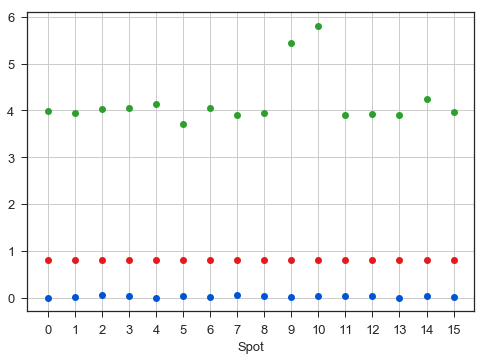

In [173]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('tau1', 'tau2', 'tau3'):
    df = popcfit3.loc[popcfit3.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)
#plt.ylim(0, 5)

In [174]:
basepar = ('ampl', 'tau')
parnames = ['%s%d' % (x, i) for i in (1, 2, 3) for x in basepar] + ['offset', 'baseline']
df = pd.DataFrame(dict(**{par: np.array(popcfit3.loc[popcfit3.name == par, 'value']) for par in parnames},
                       **{par+'_std': np.array(popcfit3.loc[popcfit3.name == par, 'stderr']) for par in parnames}))
df.head()

,ampl1,ampl1_std,ampl2,ampl2_std,ampl3,ampl3_std,baseline,baseline_std,offset,offset_std,tau1,tau1_std,tau2,tau2_std,tau3,tau3_std
0,6.121061,NaN,24.426611,NaN,66.701591,NaN,11.473068,NaN,0.813190,NaN,0.001322,NaN,0.8,NaN,3.990779,NaN
1,4.922926,NaN,28.444298,NaN,73.382251,NaN,3.483449,NaN,0.777802,NaN,0.006964,NaN,0.8,NaN,3.956274,NaN
2,13.812648,NaN,32.573063,NaN,81.857213,NaN,3.475944,NaN,0.827293,NaN,0.049638,NaN,0.8,NaN,4.033264,NaN
3,4.418477,NaN,39.398784,NaN,84.663316,NaN,11.129388,NaN,0.802522,NaN,0.047817,NaN,0.8,NaN,4.045216,NaN
4,4.372497,NaN,46.963693,NaN,95.113195,NaN,0.392439,NaN,0.815636,NaN,0.000967,NaN,0.8,NaN,4.145145,NaN


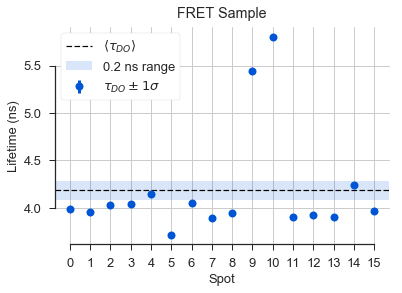

In [175]:
linplot16(df.tau3, kind='errorbar', yerr=df.tau3_std, marker='o', ms=8, lw=0, elinewidth=3, 
          title='FRET Sample', label=r'$\tau_{DO} \pm 1\sigma$')
#plt.ylim(3.4, 3.8001)
plt.axhline(df.tau3.mean(), ls='--', color='k', lw=1.2, label=r'$\langle\tau_{DO}\rangle$')
plt.axhspan(df.tau3.mean() - 0.1, df.tau3.mean() + 0.1, alpha=0.15, label='0.2 ns range')
plt.ylabel('Lifetime (ns)')
leg = plt.legend(frameon=True)#, loc='center left', bbox_to_anchor=(1, 0.5))
leg.get_frame().set(alpha=1)
sns.despine(trim=True, offset=0)

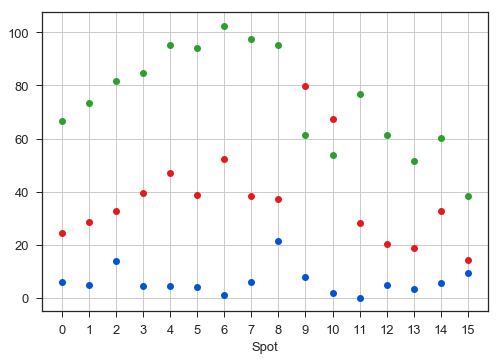

In [176]:
kws = dict(marker='o', lw=0, elinewidth=3, ms=7)
for par in ('ampl1', 'ampl2', 'ampl3'):
    df = popcfit3.loc[popcfit3.name == par, ('value', 'stderr')]
    linplot16(df.value, yerr=3*df.stderr, kind='errorbar', ax=plt.gca(), **kws)

count    16.000000
mean      0.026873
std       0.019017
min       0.000031
25%       0.009308
50%       0.029878
75%       0.044011
max       0.049808
Name: value, dtype: float64


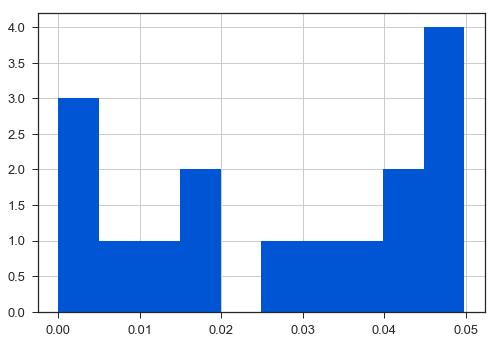

In [177]:
print(popcfit3.loc[popcfit3.name == 'tau1', 'value'].describe())
popcfit3.loc[popcfit3.name == 'tau1', 'value'].hist();

(0, 1)

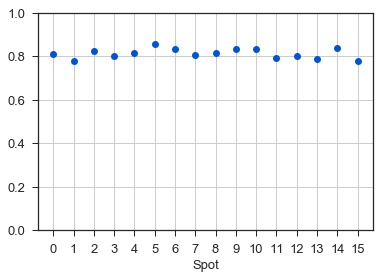

In [178]:
linplot16(np.array(popcfit3.loc[popcfit3.name == 'offset', 'value']))
plt.ylim(0, 1)

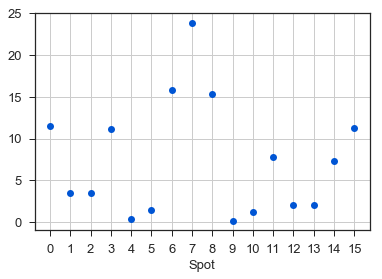

In [179]:
linplot16(np.array(popcfit3.loc[popcfit3.name == 'baseline', 'value']))